Parameters for 100mv10000hzsoundcard.wav: [-4.25733568e-01  9.99954662e+03 -3.80932319e-01]


C:\Users\samson\AppData\Local\Temp\ipykernel_18564\2365926678.py:26: WavFileWarning: Chunk (non-data) not understood, skipping it.
  samplerate, rawData = wavfile.read(file_path)


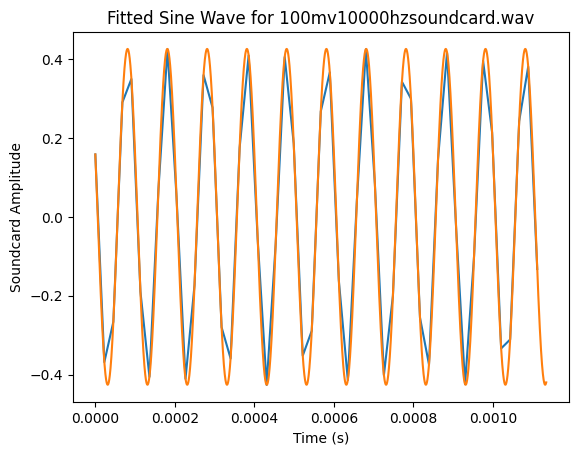

Parameters for 100mv500hzsoundcard.wav: [-4.42383074e-01  4.99989390e+02  7.52637889e-01]


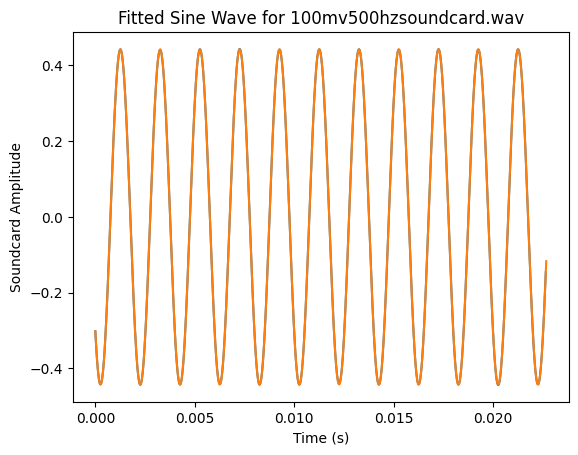

Parameters for 108mv40hzsoundcard.wav: [ 0.46766155 39.99464544 -0.23811837]


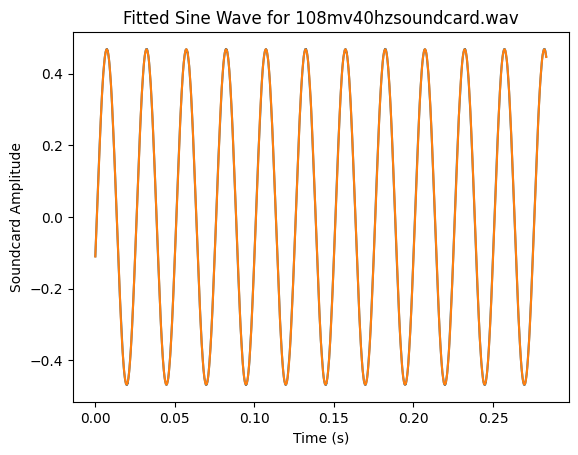

Parameters for 134mv500hzsoundcard.wav: [-5.78645808e-01  4.99991224e+02  5.98569333e-02]


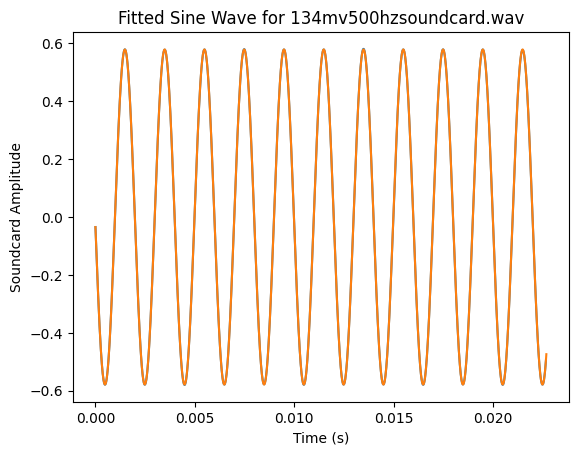

Parameters for 164mv40hzsoundcard.wav: [ 0.71227525 40.00234157 -2.03414266]


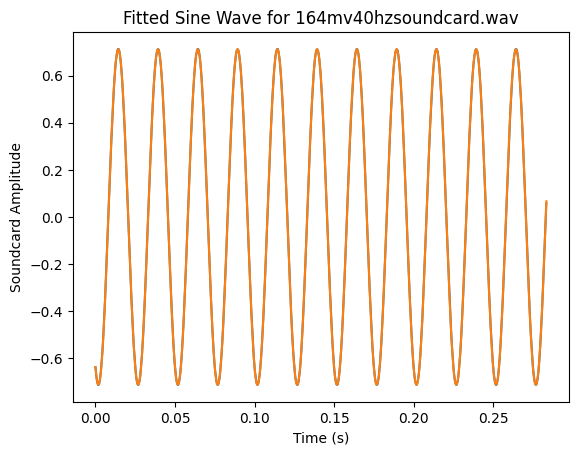

Parameters for 164mv500hzsoundcard.wav: [  0.71991461 499.96559276  -1.53293946]


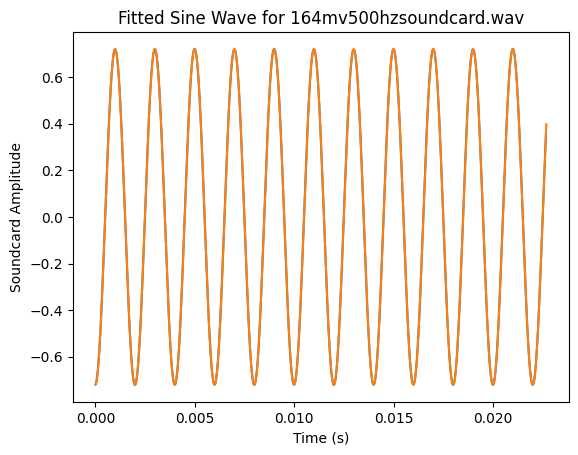

Parameters for 190mv40hzsoundcard.wav: [ 0.82026493 39.9976059   2.23054586]


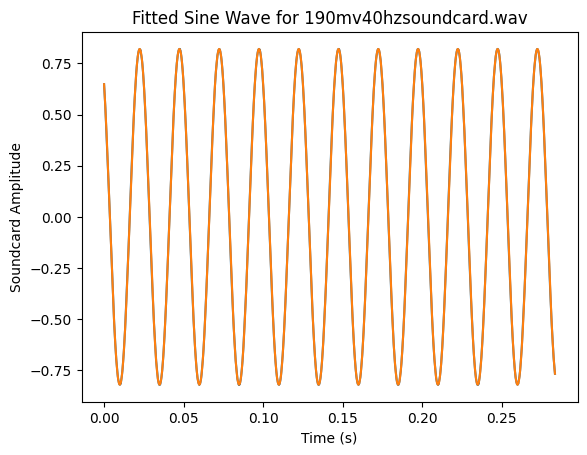

Parameters for 26mv40hzsoundcard.wav: [ 0.10885338 39.96342551  1.29080126]


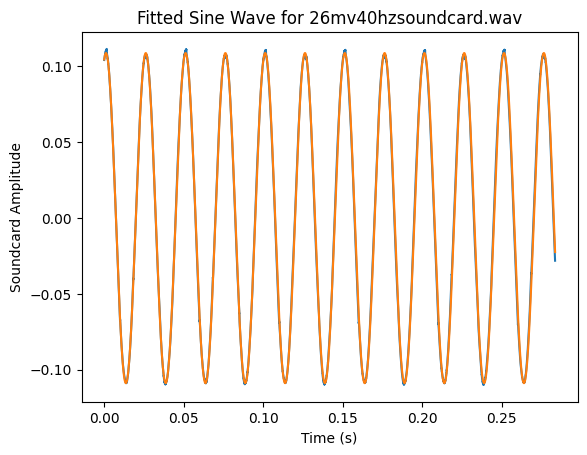

Parameters for 34mv500hzsoundcard.wav: [ 1.41777847e-01  5.00018541e+02 -2.30652873e-01]


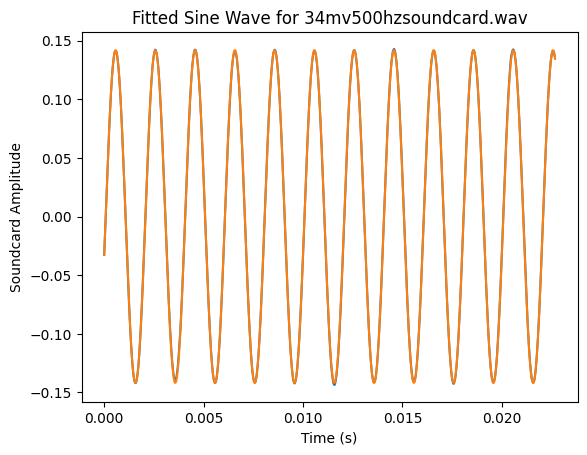

Parameters for 54mv40hzsoundcard.wav: [ 0.23997902 39.99247961 -0.09733702]


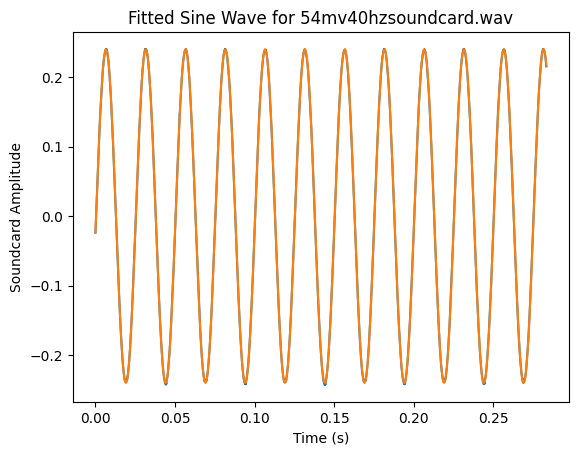

Parameters for 72mv500hzsoundcard.wav: [-3.18415458e-01  4.99974746e+02 -5.75963530e-01]


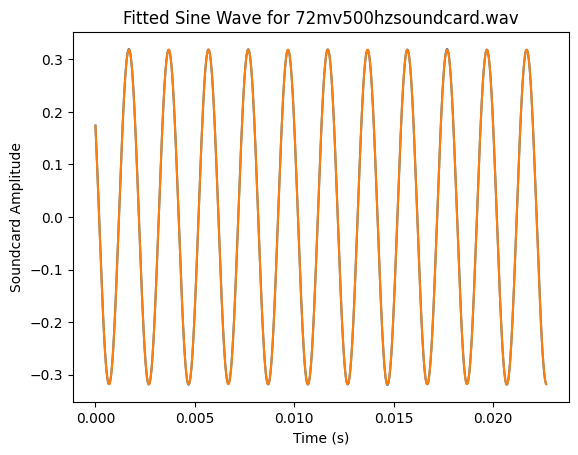

Text(0.1, 0.85, 'Voltage (mV) = (114.87 ± 0.95) * Amplitude (A)')

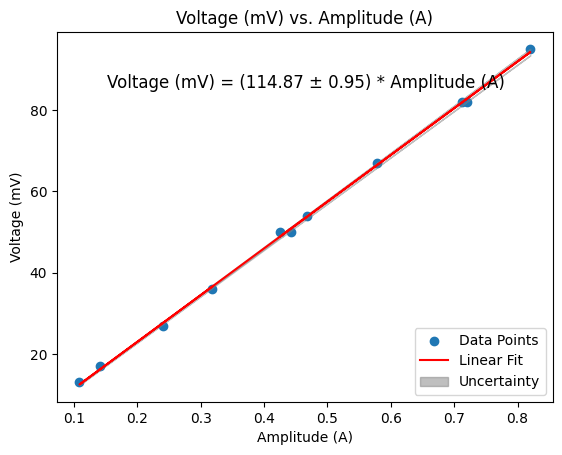

In [1]:
import numpy as np
from scipy import optimize
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy import signal
import math
import os
import re

def extract_file_name(file_path):
    return os.path.basename(file_path)

def extract_voltage_and_frequency(file_name):
    match = re.match(r'(\d+)mv(\d+)hz', file_name)
    if match:
        voltage = int(match.group(1))/2
        frequency = int(match.group(2))
        return voltage, frequency
    else:
        return None, None

def process_audio_file(file_path):
    file_name = extract_file_name(file_path)
    voltage, frequency = extract_voltage_and_frequency(file_name)

    samplerate, rawData = wavfile.read(file_path)
    
    time = np.linspace(0, rawData.shape[0] / samplerate, rawData.shape[0])   

    data = {'left': rawData[:, 0], 'right': rawData[:, 1]}

    def test_func(x, a, b, c):
        return a * np.sin(b * 2* np.pi* x + c)

    # Use voltage and frequency to create initial guess
    initial_guess = [0.425,frequency , 0.06]

    params, params_covariance = optimize.curve_fit(test_func, time[:2000], data['left'][:2000], p0=initial_guess)

    a_value, a_uncertainty = params[0], np.sqrt(params_covariance[0, 0])

    print(f"Parameters for {file_name}: {params}")
    plt.figure()
    plt.xlabel("Time (s)")
    plt.ylabel("Soundcard Amplitude")
    ##plt.xlim(0, 0.0003)
    plt.plot(time[0:int(500000/frequency)], data['left'][0:int(500000/frequency)])
    
    
    smooth_t = np.linspace(time[0], time[int(500000/frequency)], 10000)
    plt.plot(smooth_t, test_func(smooth_t, params[0], params[1], params[2]))
    plt.title(f"Fitted Sine Wave for {file_name}")
    plt.show()

    return a_value, a_uncertainty, voltage

# Directory containing audio files
folder_path = 'soundcarddata'

# List all files in the directory
file_names = os.listdir(folder_path)

# Filter out non-wav files if needed
wav_files = [file for file in file_names if file.lower().endswith('.wav')]

# Full paths to each audio file
file_paths = [os.path.join(folder_path, file_name) for file_name in wav_files]

# Extract 'a' values, uncertainties, and voltage values for each file
a_values = []
a_uncertainties = []
voltage_values_mV = []
for file_path in file_paths:
    a_value, a_uncertainty, voltage = process_audio_file(file_path)
    a_values.append(np.abs(a_value))
    a_uncertainties.append(a_uncertainty)
    voltage_values_mV.append(voltage)

# Perform a linear fit of 'V' (Voltage in mV) with 'A' (Amplitude)
coefficients, cov_matrix = np.polyfit(a_values, voltage_values_mV, 1, cov=True)
coefficient = coefficients[0]
coefficient_uncertainty = np.sqrt(cov_matrix[0, 0])

# Plot the linear fit with uncertainty
plt.figure()
plt.scatter(a_values, voltage_values_mV, label='Data Points')
plt.plot(a_values, coefficient * np.array(a_values), color='red', label='Linear Fit')
plt.fill_between(
    a_values,
    (coefficient - coefficient_uncertainty) * np.array(a_values),
    (coefficient + coefficient_uncertainty) * np.array(a_values),
    color='gray',
    alpha=0.5,
    label='Uncertainty'
)
plt.xlabel("Amplitude (A)")
plt.ylabel("Voltage (mV)")
plt.title("Voltage (mV) vs. Amplitude (A)")
plt.legend(loc='lower right')

# Display the linear equation with uncertainty on the graph
linear_eqn = f"Voltage (mV) = ({coefficient:.2f} ± {coefficient_uncertainty:.2f}) * Amplitude (A)"
plt.annotate(linear_eqn, xy=(0.1, 0.85), xycoords='axes fraction', fontsize=12)


Parameters for 26mv250hzamplifier.wav: [-17.31227194 250.0713477   -0.95326854]


C:\Users\samson\AppData\Local\Temp\ipykernel_18564\1633741002.py:31: WavFileWarning: Chunk (non-data) not understood, skipping it.
  samplerate, rawData = wavfile.read(file_path)


<Figure size 640x480 with 0 Axes>

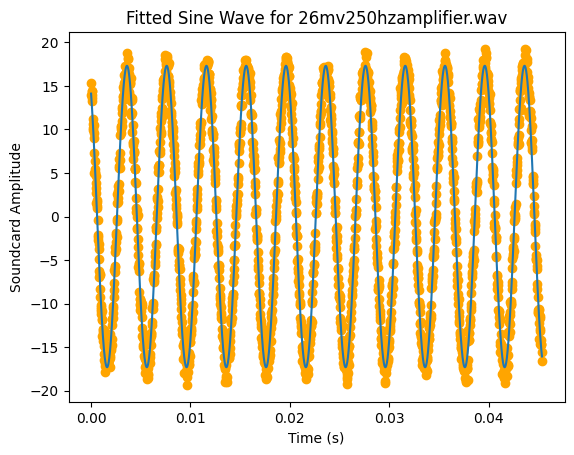

Parameters for 26mv25hzamplifier.wav: [14.33198679 24.9673824  -1.02702555]


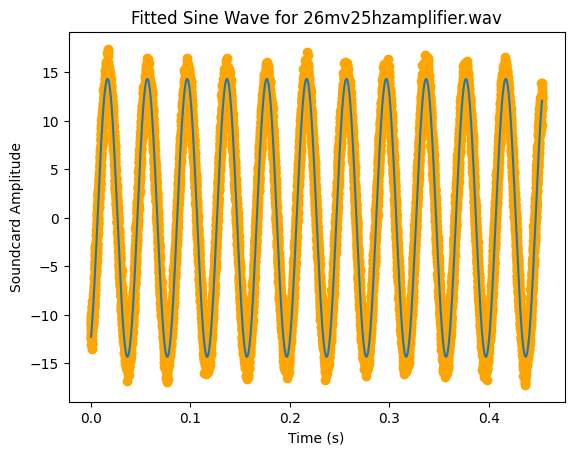

Parameters for 26mv50hzamplifier.wav: [-16.02645206  40.08171505   0.84755026]


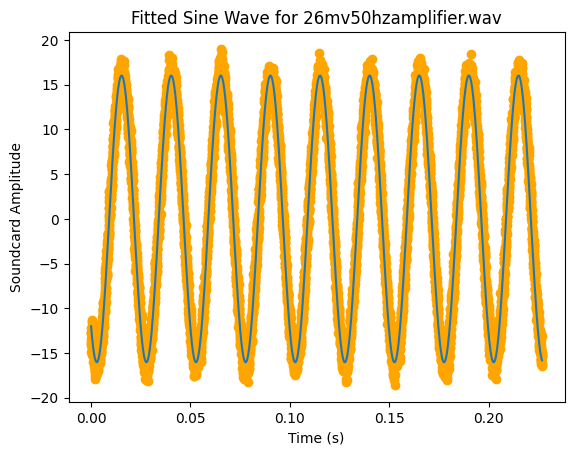

Parameters for 44mv10hzamplifier.wav: [15.14404527 10.17003466 -0.13272916]


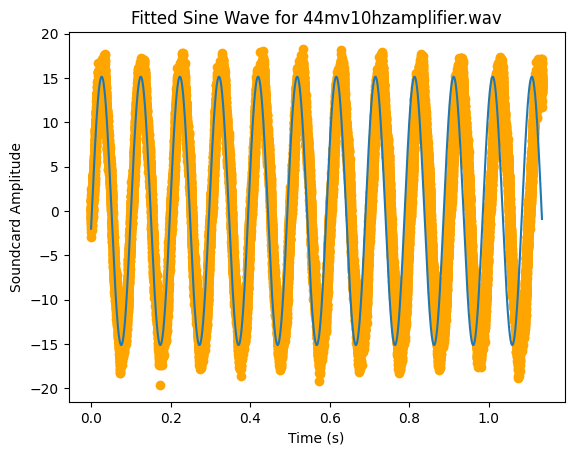

Parameters for 49.6mv5hzamplifier.wav: [-8.86147868  4.31065287 -0.33172732]


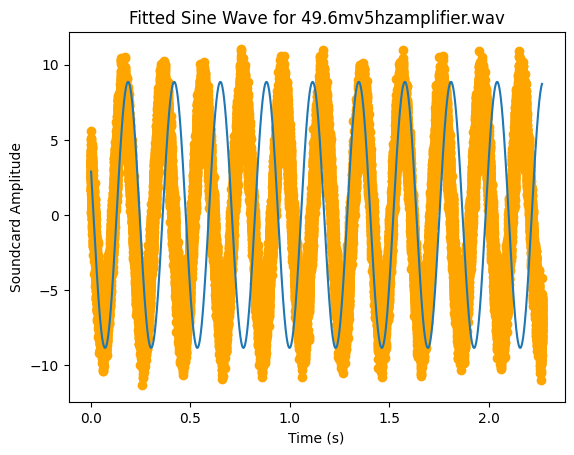

Parameters for 50mv100hzamplifier.wav: [32.80174856 99.96544257 -1.3831652 ]


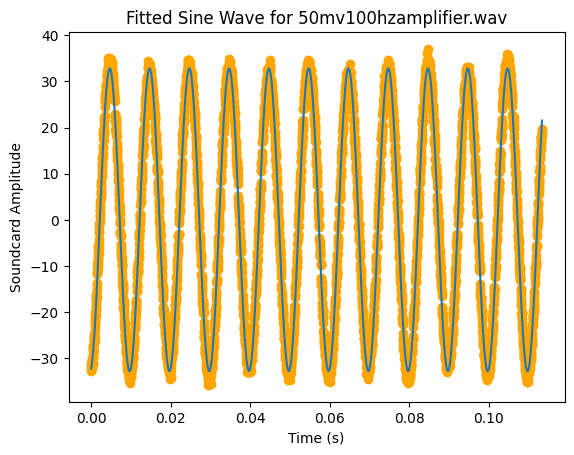

Parameters for 50mv500hzamplifier.wav: [-3.30665829e+01  5.00041905e+02 -8.70560133e-02]


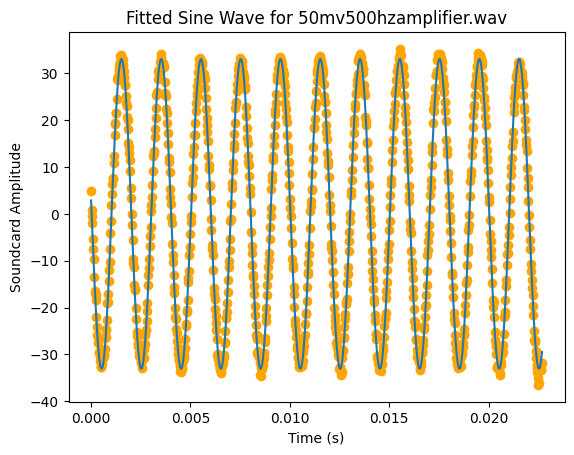

Parameters for 56mv10000hzamplifier.wav: [-2.53640045e+01  9.99743637e+03  1.04676282e+00]


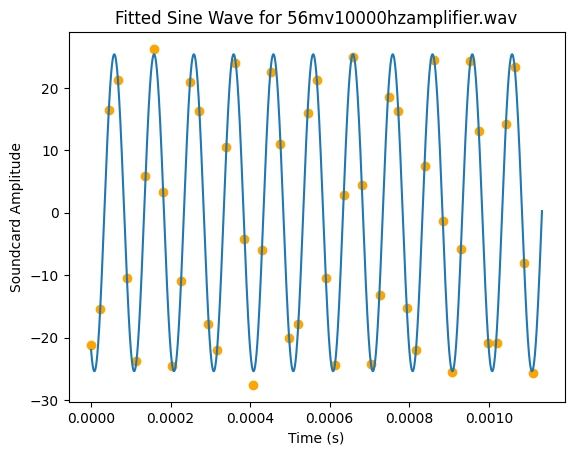

Parameters for 56mv12500hzamplifier.wav: [-2.27170330e+01  1.25007676e+04  1.88043197e-01]


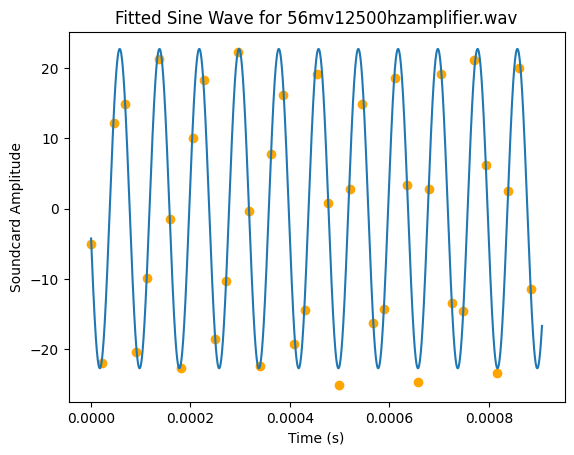

Parameters for 56mv15000hzamplifier.wav: [-1.92546564e+01  1.49956260e+04  2.28237427e-01]


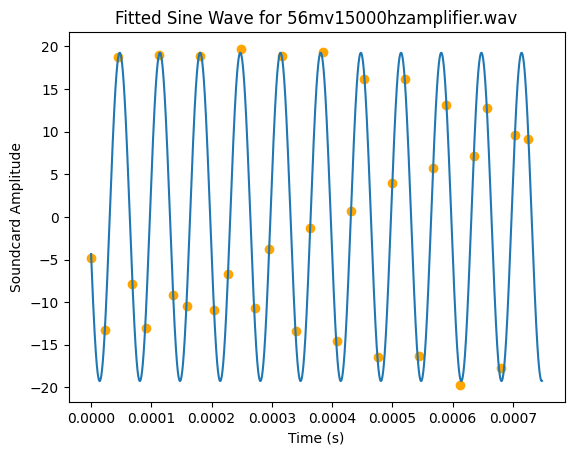

Parameters for 56mv17500hzamplifier.wav: [ 1.72430443e+01  1.75005697e+04 -1.58151022e+00]


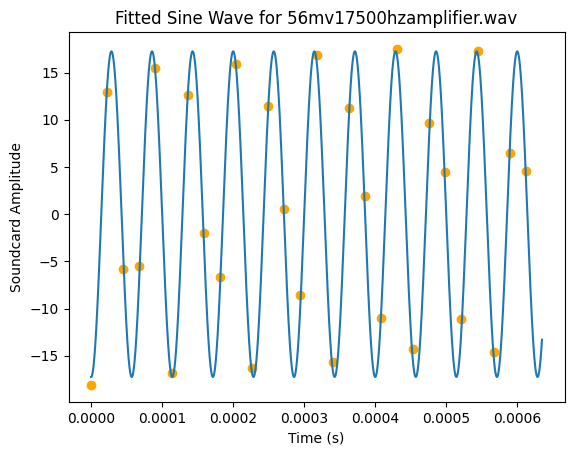

Parameters for 56mv20000hzamplifier.wav: [1.33820578e+01 1.99923190e+04 1.43081106e+00]


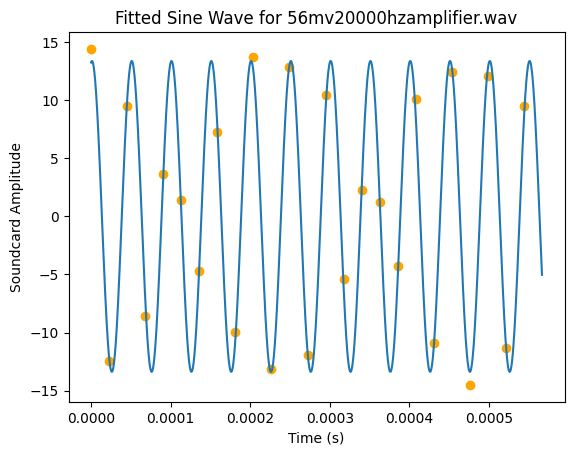

Parameters for 56mv3000hzamplifier.wav: [3.53321401e+01 2.99990596e+03 1.29341238e+00]


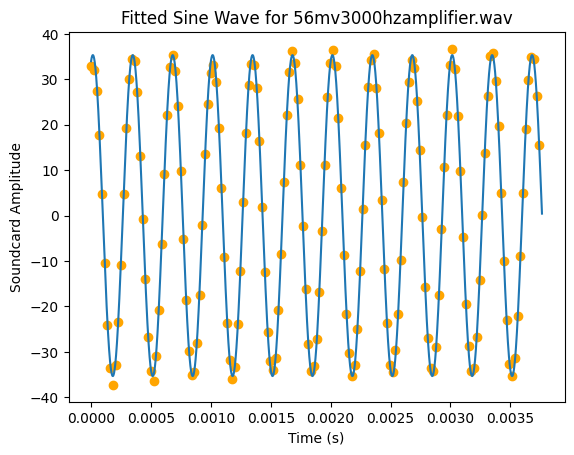

Parameters for 56mv5000hzamplifier.wav: [-3.34453115e+01  4.99898332e+03  1.12102799e+00]


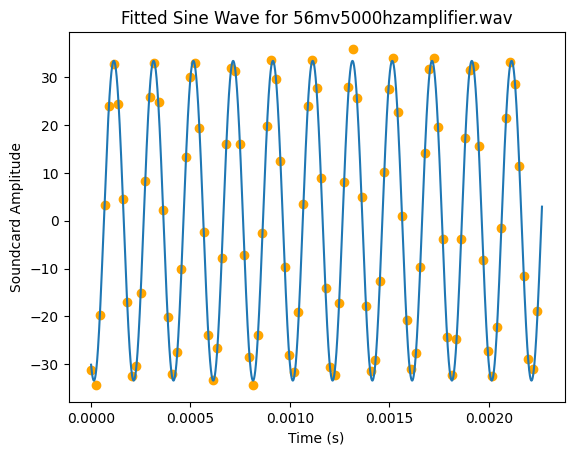

Parameters for 56mv7000hzamplifier.wav: [-3.07229283e+01  7.00003447e+03  7.71571139e-01]


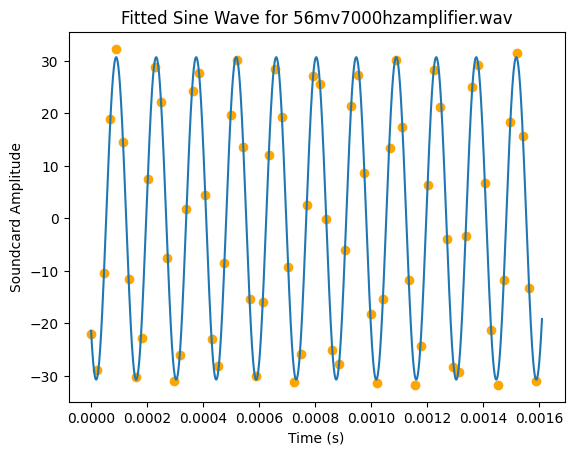

Parameters for 56mv8500hzamplifier.wav: [2.76827053e+01 8.50035311e+03 1.05137119e+00]


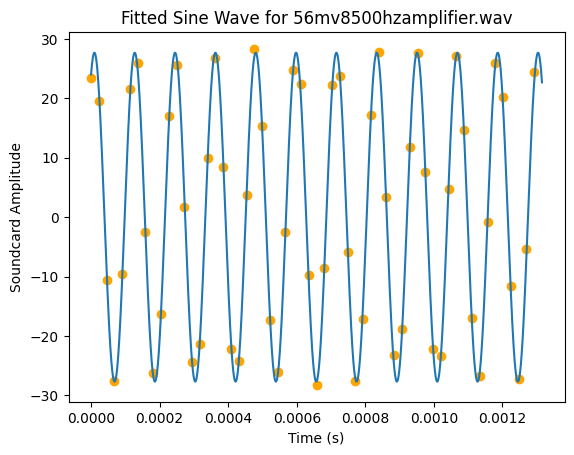

In [2]:
# Given values
R1 = 30029
R2 = 18.194
divisor = R2 / (R1 + R2)

# Function to extract input voltage and frequency from the file name
def extract_input_voltage_and_frequency(file_name):
    match = re.match(r'(\d+(?:\.\d+)?)mv(\d+)hz', file_name)
    if match:
        input_voltage = float(match.group(1))/2
        frequency = int(match.group(2))
        return input_voltage, frequency
    else:
        return None, None



# Function to process audio files for amplifier calibration
def process_audio_file_amp(file_path):
    file_name = os.path.basename(file_path)
    input_voltage, frequency = extract_input_voltage_and_frequency(file_name)

    samplerate, rawData = wavfile.read(file_path)
    time = np.linspace(0, rawData.shape[0] / samplerate, rawData.shape[0])

    data = {'left': coefficient * rawData[:, 0], 'right': coefficient * rawData[:, 1]}

    def test_func(x, a, b, c):
        return a * np.sin(b * 2 * np.pi * x + c)

    # Use input voltage and frequency to create an initial guess
    initial_guess = [input_voltage, frequency, 0.06]

    params, params_covariance = optimize.curve_fit(test_func, time[:2000], data['left'][:2000], p0=initial_guess)

    a_value, a_uncertainty = params[0], np.sqrt(params_covariance[0, 0])

    print(f"Parameters for {file_name}: {params}")
    plt.figure()
    plt.xlabel("Time (s)")
    plt.ylabel("Soundcard Amplitude")
    plt.scatter(time[0:int(500000 / frequency)], data['left'][0:int(500000 / frequency)], color='orange', marker='o', label='Scatter Plot')

    smooth_t = np.linspace(time[0], time[int(500000 / frequency)], 10000)
    plt.plot(smooth_t, test_func(smooth_t, params[0], params[1], params[2]))
    plt.title(f"Fitted Sine Wave for {file_name}")
    plt.show()

    return a_value, a_uncertainty, input_voltage, frequency

# Directory containing audio files for amplifier calibration
folder_path_amp = 'amplifiercalibration'

# List all files in the directory for amplifier calibration
file_names_amp = os.listdir(folder_path_amp)

# Filter out non-wav files if needed for amplifier calibration
wav_files_amp = [file for file in file_names_amp if file.lower().endswith('.wav')]

# Full paths to each audio file for amplifier calibration
file_paths_amp = [os.path.join(folder_path_amp, file_name) for file_name in wav_files_amp]

# Extract 'a' values, uncertainties, input voltage, and frequency values for each file in amplifier calibration
a_values_amp = []
a_uncertainties_amp = []
input_voltage_values = []
frequency_values_Hz_amp = []

# Create a figure
plt.figure()

for file_path_amp in file_paths_amp:
    a_value_amp, a_uncertainty_amp, input_voltage, frequency_amp = process_audio_file_amp(file_path_amp)

    # Append the values to the lists
    a_values_amp.append(np.abs(a_value_amp))
    a_uncertainties_amp.append(a_uncertainty_amp)
    input_voltage_values.append(input_voltage)
    frequency_values_Hz_amp.append(frequency_amp)

# Calculate amplifier input for amplifier calibration
amplifier_in_amp = np.array(input_voltage_values) * divisor

# Calculate amplifier gain for amplifier calibration using accumulated voltage values
amplifier_gain_amp = np.array(a_values_amp) / amplifier_in_amp

# Scatter plot of Frequency vs. Amplifier Gain for amplifier calibration
#plt.scatter(frequency_values_Hz_amp, amplifier_gain_amp, color='blue', marker='o', label='Scatter Plot')
#plt.xlabel("Frequency (Hz)")
#plt.ylabel("Amplifier Gain")
#plt.title("Scatter Plot of Frequency vs. Amplifier Gain - Amplifier Calibration")
#plt.grid(False)  # Optionally, you can add a grid

#plt.show()


C:\Users\samson\AppData\Local\Temp\ipykernel_18564\778197860.py:26: RuntimeWarning: divide by zero encountered in divide
  ratio = Rtrans / (1 / (1j * omega * Ctrans) + Rtrans)
C:\Users\samson\AppData\Local\Temp\ipykernel_18564\778197860.py:26: RuntimeWarning: invalid value encountered in divide
  ratio = Rtrans / (1 / (1j * omega * Ctrans) + Rtrans)


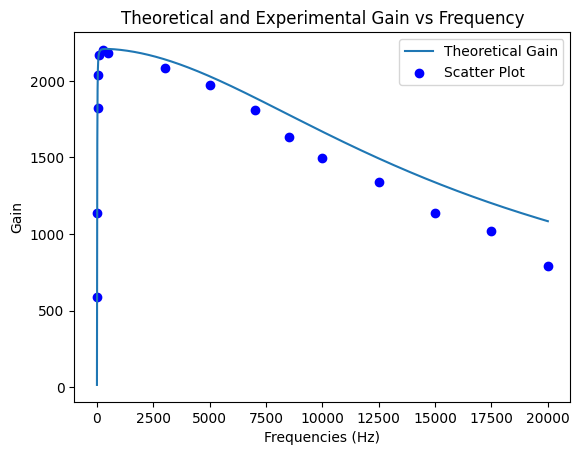

In [3]:

# Define the values of resistance (R), capacitance (C), and angular frequency (omega).
R2 = 20000  # Resistance in ohms
C1 = 680e-12  # Capacitance in farads (using scientific notation)
frequencies = np.linspace(0, 20000, 200000)
R1 = 100

# Calculate the equivalent impedance for the first stage
omega = 2 * np.pi * frequencies
Z1 = 1 / (1/R2 + 1j * omega * C1)

# Calculate the gain for the first stage
Zeq1 = R1 / (Z1 + R1)
gain_1 = 1 / Zeq1

# Calculate and print the magnitude of the gain for the first stage
magnitude_of_gain_1 = abs(gain_1)

# Define the values for the voltage divider stage
Ctrans = 0.22e-6
Rtrans = 47000

# Calculate the voltage divider ratio correctly
ratio = Rtrans / (1 / (1j * omega * Ctrans) + Rtrans)
magnitude_of_ratio = abs(ratio)

# Define the values of resistance (R), capacitance (C), and angular frequency (omega) for the second stage.
R4 = 2000  # Resistance in ohms
C2 = 1e-9  # Capacitance in farads (using scientific notation)
R3 = 200

# Calculate the equivalent impedance for the second stage
Z2 = 1 / (1/R4 + 1j * omega * C2)

# Calculate the gain for the second stage
Zeq2 = R3 / (Z2 + R3)
gain_2 = 1 / Zeq2

# Calculate and print the magnitude of the gain for the second stage
magnitude_of_gain_2 = abs(gain_2)

# Calculate the final gain as the product of the magnitudes of the gains and the voltage divider ratio
final_gain_theoretical = magnitude_of_gain_1 * magnitude_of_ratio * magnitude_of_gain_2

# Create a plot for theoretical gain
plt.plot(frequencies, final_gain_theoretical, label='Theoretical Gain')
thfrequencies=frequencies
# Create a plot for experimental gain
plt.scatter(frequency_values_Hz_amp, amplifier_gain_amp, color='blue', marker='o', label='Scatter Plot')

plt.xlabel('Frequencies (Hz)')
plt.ylabel('Gain')
plt.title('Theoretical and Experimental Gain vs Frequency')
plt.legend()  # Show legend

# Show the plot
plt.show()


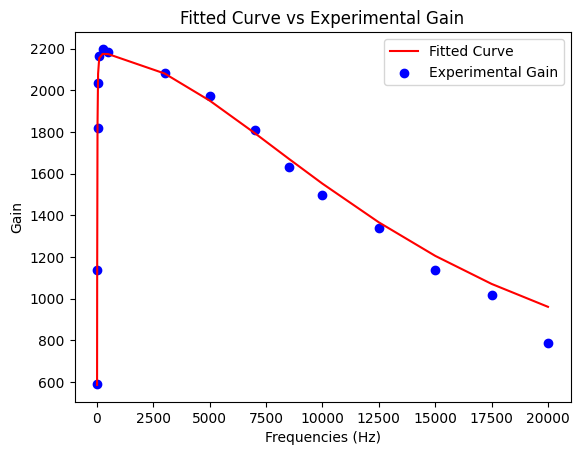

Fitted Parameters: a = 1.045022176722391, b = 4.132606564300386e-07, c = -0.010430839746775233, d = -1.8497689773861873e-11, e = -127.66974185467238
Fitted Equation: 1.0450 * final_gain_theoretical + 0.0000 * frequencies**2 + -0.0104 * frequencies + -0.0000 * frequencies**3 + -127.6697


In [4]:
from scipy.optimize import curve_fit


# Given data

sorted_indices = np.argsort(np.array(frequency_values_Hz_amp))
frequencies = np.array(frequency_values_Hz_amp)[sorted_indices]
experimental_gain = np.array(amplifier_gain_amp)[sorted_indices]

# Function to fit
def fit_function(frequencies, a, b, c, d, e):
    # Define the function based on your theoretical model
    R2 = 20000
    C1 = 680e-12
    R1 = 100
    
    omega = 2 * np.pi * frequencies
    Z1 = 1 / (1/R2 + 1j * omega * C1)
    Zeq1 = R1 / (Z1 + R1)
    gain_1 = 1 / Zeq1

    Ctrans = 0.22e-6
    Rtrans = 47000
    ratio = Rtrans / (1 / (1j * omega * Ctrans) + Rtrans)

    R4 = 2000
    C2 = 1e-9
    R3 = 200
    Z2 = 1 / (1/R4 + 1j * omega * C2)
    Zeq2 = R3 / (Z2 + R3)
    gain_2 = 1 / Zeq2

    final_gain_theoretical = abs(gain_1) * abs(ratio) * abs(gain_2)

    # Use the fitted parameters a, b, c, d, e to adjust the function
    return a * final_gain_theoretical + b * frequencies**2 + c * frequencies + d * frequencies**3 + e

# Perform the curve fit
initial_guess = [1, 1, 1, 1, 1]  # Initial guess for the parameters
params, covariance = curve_fit(fit_function, frequencies, experimental_gain, p0=initial_guess)

# Extract the fitted parameters
a_fit, b_fit, c_fit, d_fit, e_fit = params

# Generate y values from the fitted function
fitted_curve = fit_function(frequencies, a_fit, b_fit, c_fit, d_fit, e_fit)

# Plot the theoretical gain, experimental gain, and the fitted curve
plt.plot(frequencies, fitted_curve, label='Fitted Curve', color='red')
plt.scatter(frequencies, experimental_gain, color='blue', marker='o', label='Experimental Gain')
plt.xlabel('Frequencies (Hz)')
plt.ylabel('Gain')
plt.title('Fitted Curve vs Experimental Gain')
plt.legend()
plt.show()

# Display the fitted parameters
print(f"Fitted Parameters: a = {a_fit}, b = {b_fit}, c = {c_fit}, d = {d_fit}, e = {e_fit}")
# Display the equation
equation = f"{a_fit:.4f} * final_gain_theoretical + {b_fit:.4f} * frequencies**2 + {c_fit:.4f} * frequencies + {d_fit:.4f} * frequencies**3 + {e_fit:.4f}"
print("Fitted Equation:", equation)

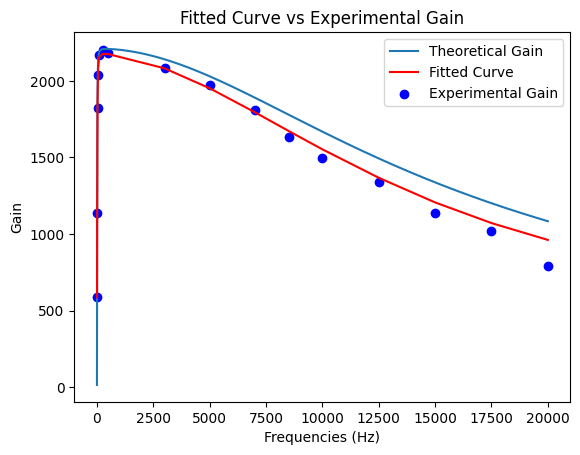

In [5]:
plt.plot(thfrequencies, final_gain_theoretical, label='Theoretical Gain')
plt.plot(frequencies, fitted_curve, label='Fitted Curve', color='red')
plt.scatter(frequencies, experimental_gain, color='blue', marker='o', label='Experimental Gain')
plt.xlabel('Frequencies (Hz)')
plt.ylabel('Gain')
plt.title('Fitted Curve vs Experimental Gain')
plt.legend()
plt.show()

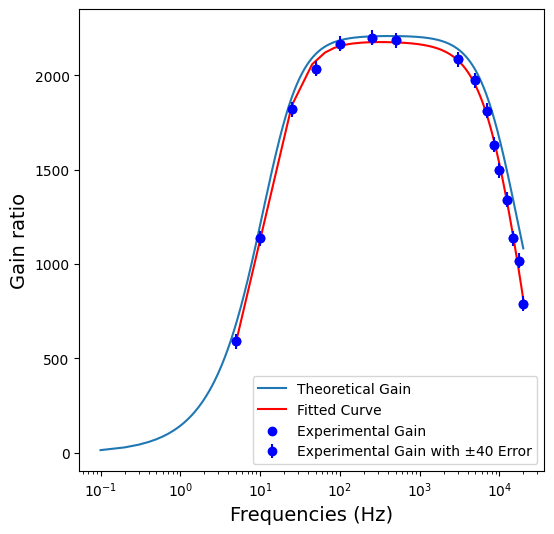

In [6]:
# Assuming frequencies, final_gain_theoretical, fitted_curve, and experimental_gain are defined

# Create a smooth range of frequencies
smooth_resistances = np.linspace(frequencies.min(), frequencies.max(), 1000)

# Calculate the fitted curve
fitted_curve = fit_function(smooth_resistances, a_fit, b_fit, c_fit, d_fit, e_fit)

# Plot the results with error bars on each data point
plt.figure(figsize=(6, 6))
plt.xscale('log')

# Plot the theoretical gain
plt.plot(thfrequencies, final_gain_theoretical, label='Theoretical Gain')

# Plot the fitted curve
plt.plot(smooth_resistances, fitted_curve, label='Fitted Curve', color='red')

# Plot the experimental gain with error bars
plt.errorbar(frequencies, experimental_gain, yerr=40, fmt='o', color='blue', label='Experimental Gain with ±40 Error')

# Scatter plot for experimental gain (optional)
plt.scatter(frequencies, experimental_gain, color='blue', marker='o', label='Experimental Gain')

# Set labels and title
plt.xlabel('Frequencies (Hz)', fontsize=14)
plt.ylabel('Gain ratio', fontsize=14)
plt.legend()

# Save the plot as "gain.pdf"
plt.savefig('gain.pdf')

# Show the plot (optional)
plt.show()


C:\Users\samson\AppData\Local\Temp\ipykernel_18564\1808503930.py:32: WavFileWarning: Chunk (non-data) not understood, skipping it.
  samplerate, rawData = wavfile.read(file_path)
C:\Users\samson\AppData\Local\Temp\ipykernel_18564\2434765197.py:25: RuntimeWarning: divide by zero encountered in divide
  ratio = Rtrans / (1 / (1j * omega * Ctrans) + Rtrans)
C:\Users\samson\AppData\Local\Temp\ipykernel_18564\2434765197.py:25: RuntimeWarning: invalid value encountered in divide
  ratio = Rtrans / (1 / (1j * omega * Ctrans) + Rtrans)
C:\Users\samson\AppData\Local\Temp\ipykernel_18564\1808503930.py:49: RuntimeWarning: invalid value encountered in divide
  normalPxx_den_csd =(Pxx_den_csd) / (amplifier_gain) ** 2
c:\Users\samson\anaconda3\envs\p309\Lib\site-packages\matplotlib\cbook.py:1699: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
c:\Users\samson\anaconda3\envs\p309\Lib\site-packages\matplotlib\cbook.py:1345: ComplexWarning: Casting

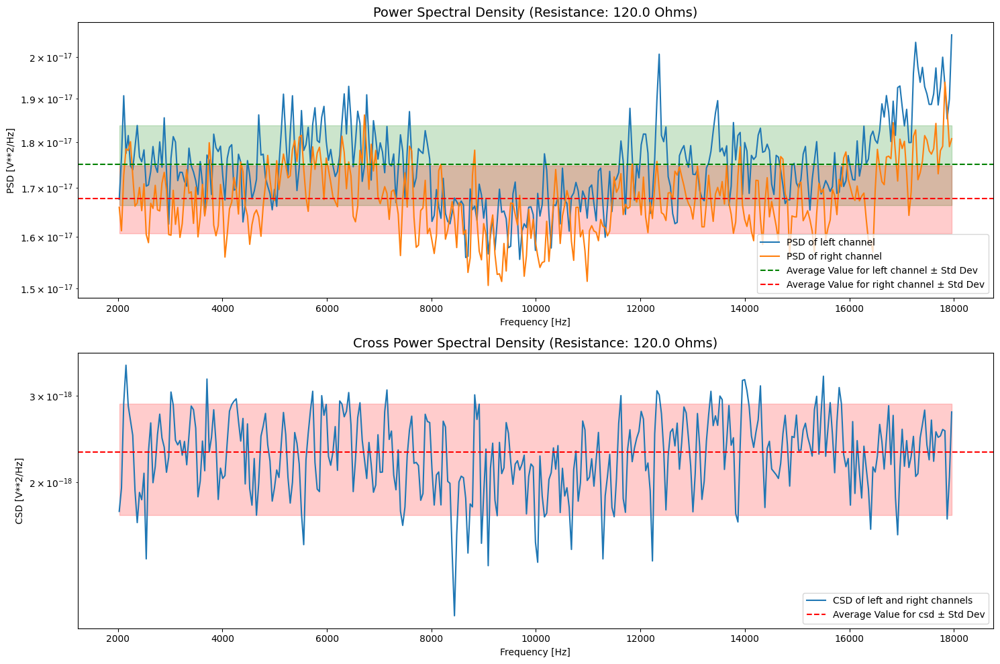

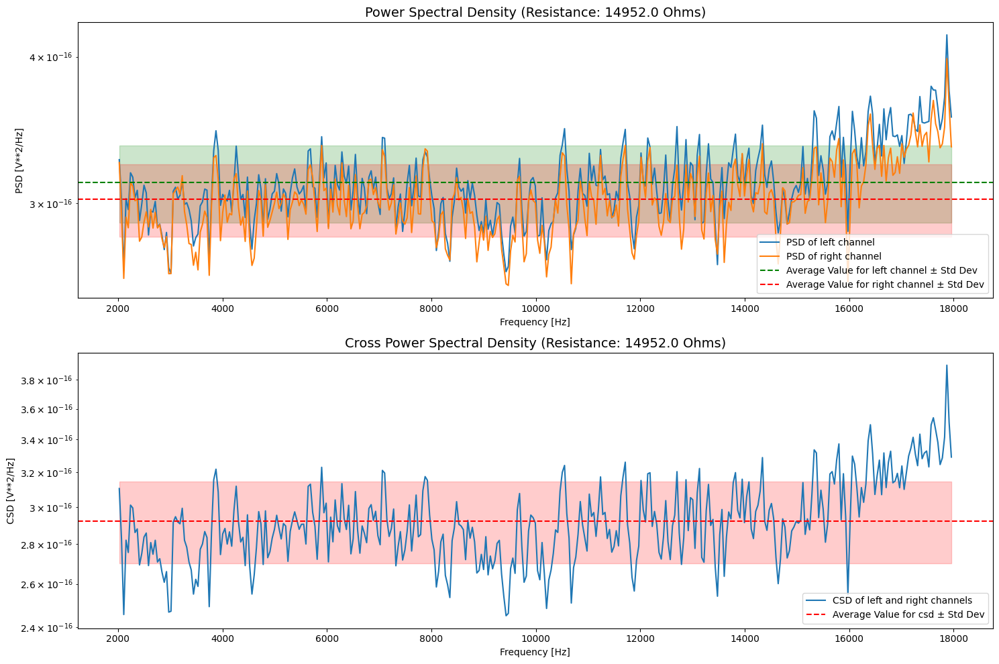

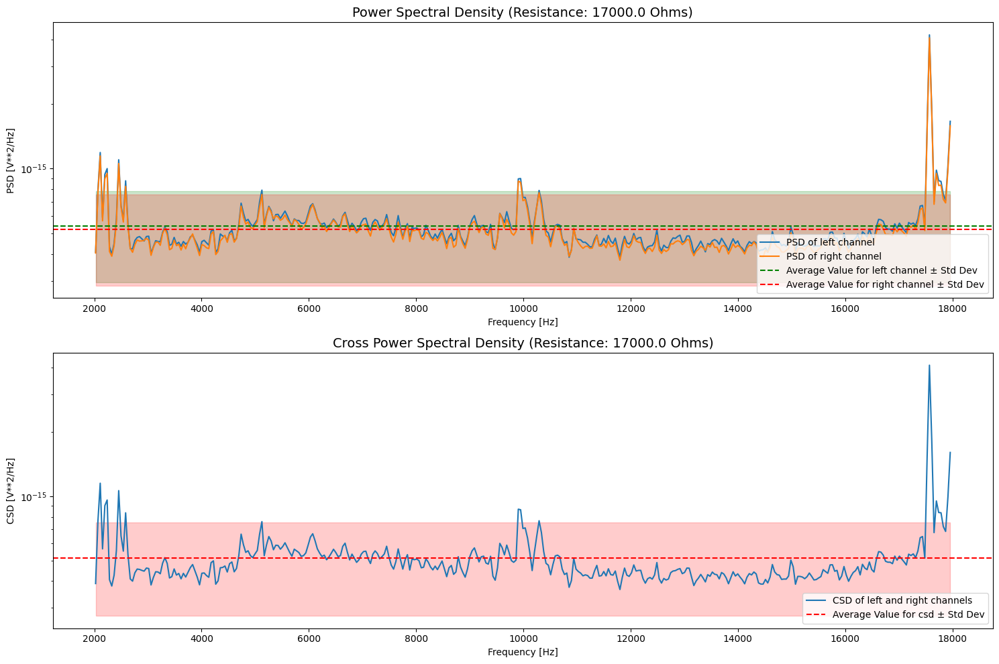

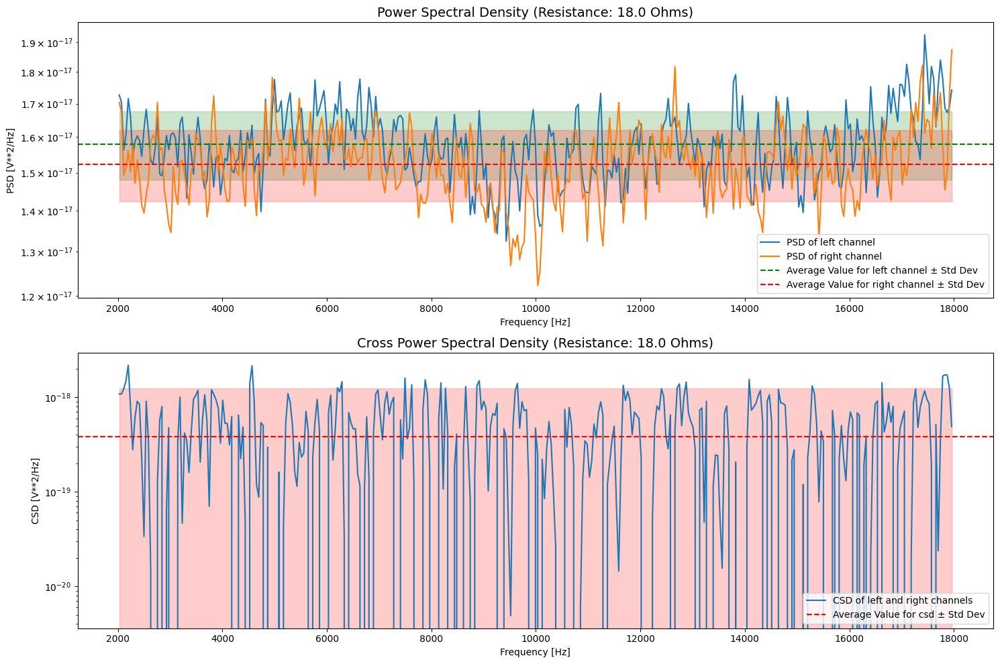

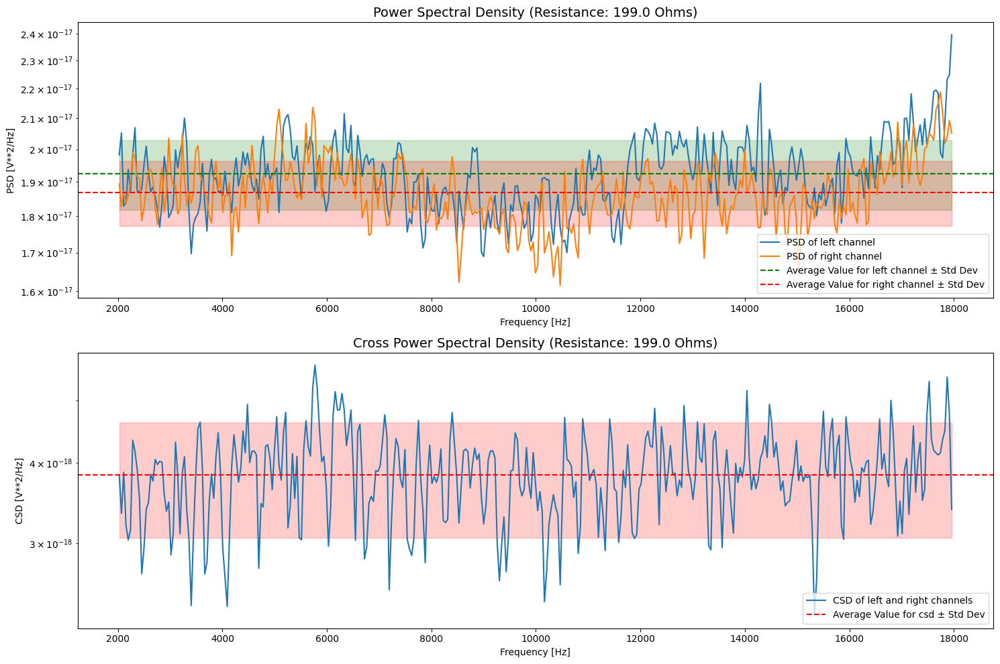

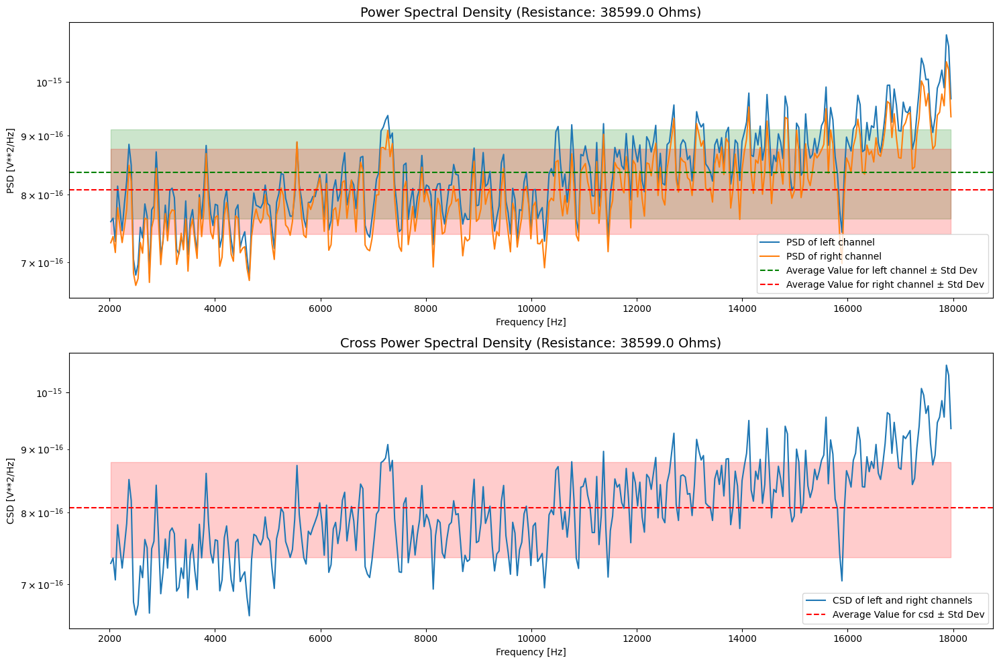

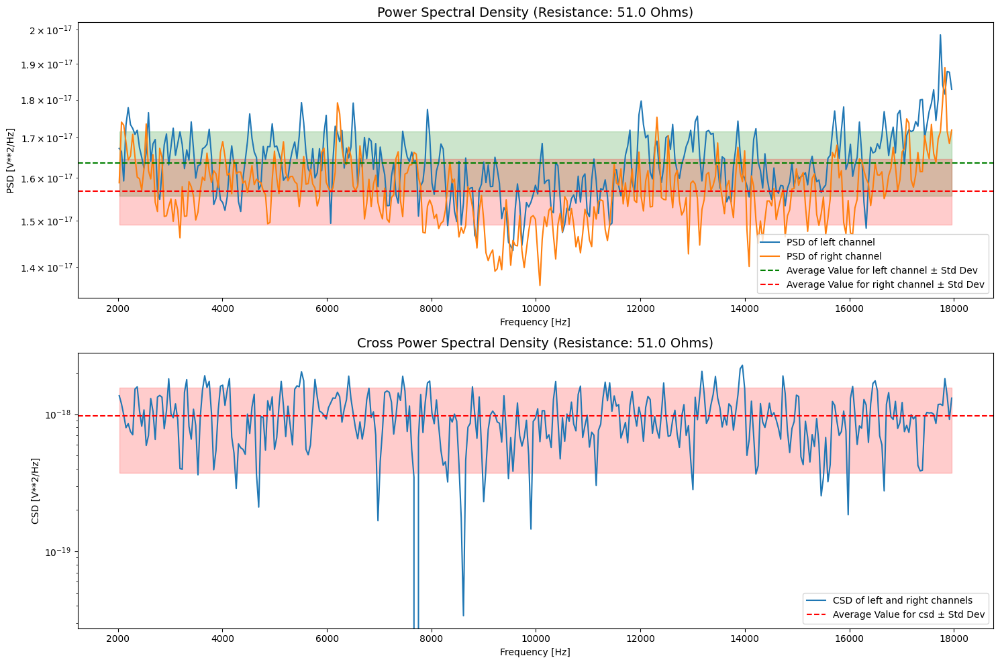

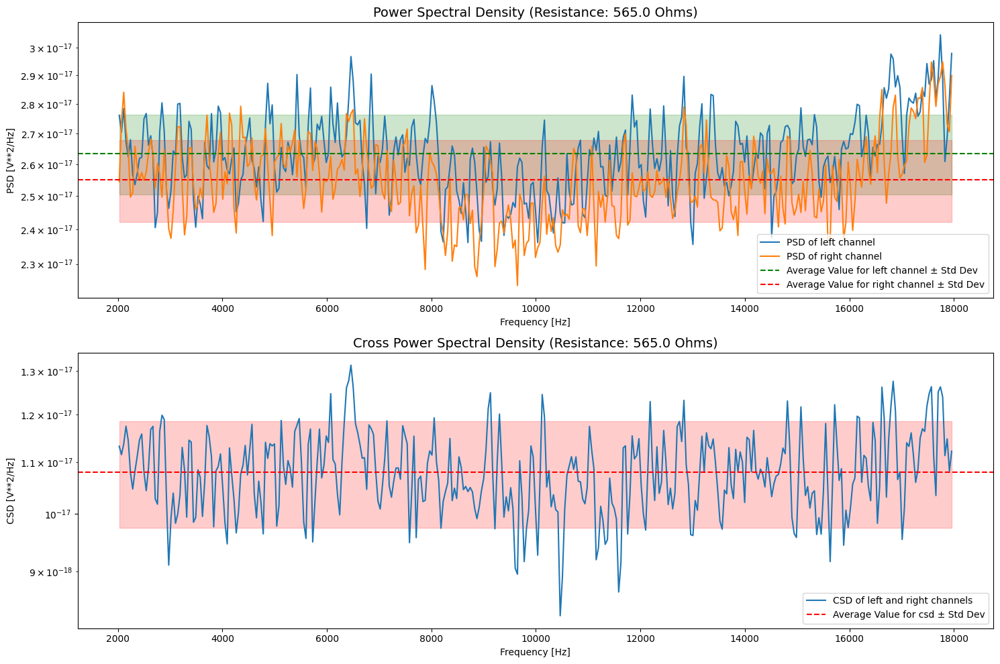

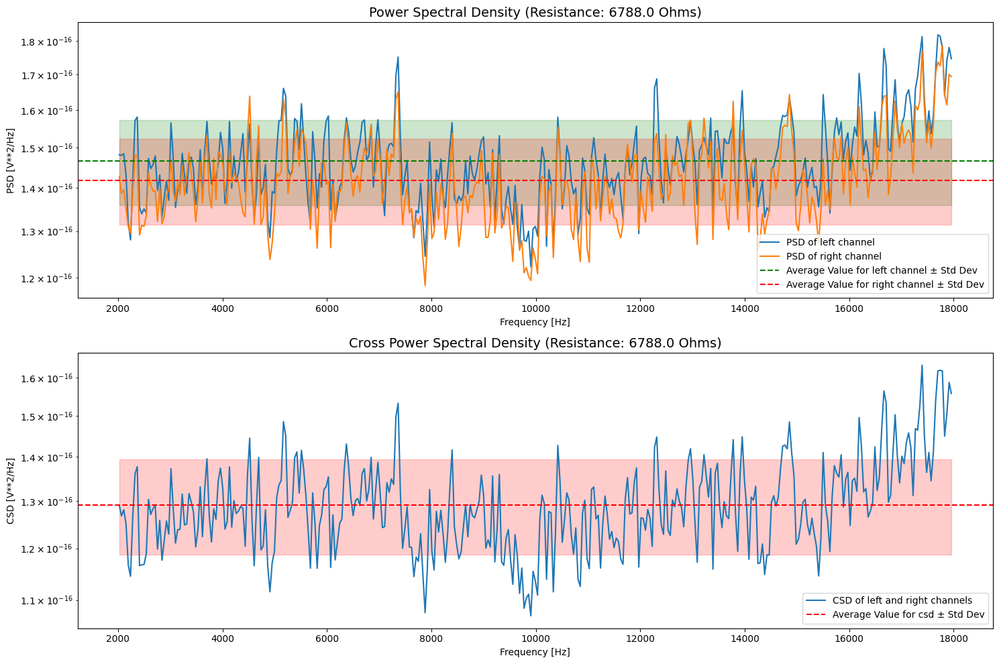

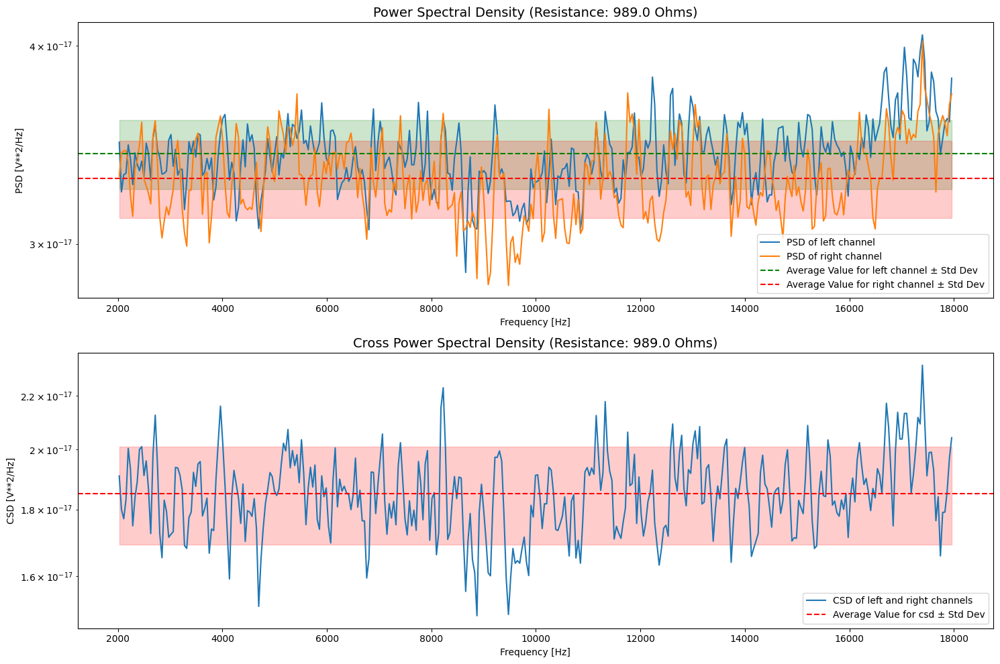

In [7]:


temperature_kevin = []
average_csds = []
average_psd_lefts = []
average_psd_rights = []
std_dev_csds = []
std_dev_psd_lefts = []
std_dev_psd_rights = []

# Define the extract_input_resistance function
def extract_input_resistance(file_name):
    match = re.match(r'(\d+(?:\.\d+)?)ohmjohnson', file_name)
    if match:
        resistance = float(match.group(1))
        return resistance
    else:
        return None

# Function to process audio files for amplifier calibration
def process_audio_file_resistance(file_path, coefficient):
    file_name = os.path.basename(file_path)
    resistance = extract_input_resistance(file_name)

    if resistance is not None and resistance <= 50000:
        temperature_kevin.append(resistance)
        samplerate, rawData = wavfile.read(file_path)

        data = {'left': coefficient * rawData[:, 0], 'right': coefficient * rawData[:, 1]}

        # Calculate the voltage 'v' from the right channel data
        v_left = data['left'] / 1000
        v_right = data['right'] / 1000
        # Calculate the periodogram CSD
        fs = 44100  # Sampling rate
        f, Pxx_den_per_left = signal.welch(v_left, fs, nperseg=1024)
        f, Pxx_den_per_right = signal.welch(v_right, fs, nperseg=1024)
        f, Pxx_den_csd = signal.csd(v_left, v_right, fs, nperseg=1024)

        # Calculate amplifier gain using fit_function
        amplifier_gain = fit_function(f, a_fit, b_fit, c_fit, d_fit, e_fit)

        # Normalize the power spectral density
        normalPxx_den_csd =(Pxx_den_csd) / (amplifier_gain) ** 2
        normalPxx_den_per_left = Pxx_den_per_left / (amplifier_gain) ** 2
        normalPxx_den_per_right = Pxx_den_per_right / (amplifier_gain) ** 2

        # Filter values in the specified frequency range
        mask = (f >= 2000) & (f <= 18000)
        filtered_frequencies = f[mask]
        filtered_normalPxx_den_csd = normalPxx_den_csd[mask]
        filtered_normalPxx_den_per_left = normalPxx_den_per_left[mask]
        filtered_normalPxx_den_right = normalPxx_den_per_right[mask]
        # Calculate the average value and standard deviation
        average_value_csd = np.mean(filtered_normalPxx_den_csd)
        average_value_psd_left = np.mean(filtered_normalPxx_den_per_left)
        average_value_psd_right = np.mean(filtered_normalPxx_den_right)

        std_dev_csd = np.std(filtered_normalPxx_den_csd)
        std_dev_psd_left = np.std(filtered_normalPxx_den_per_left)
        std_dev_psd_right = np.std(filtered_normalPxx_den_right)

        average_csds.append(average_value_csd)
        average_psd_lefts.append(average_value_psd_left)
        average_psd_rights.append(average_value_psd_right)

        std_dev_csds.append(std_dev_csd)
        std_dev_psd_lefts.append(std_dev_psd_left)
        std_dev_psd_rights.append(std_dev_psd_right)

        # Plot the Welch PSD and the horizontal line at the average value with standard deviation
        # Plotting
        fig, (ax1, ax2) = plt.subplots(2, figsize=(15, 10))

        ax1.set_xlabel('Frequency [Hz]', fontsize=10)
        ax1.set_ylabel('PSD [V**2/Hz]', fontsize=10)
        ax1.set_title(f'Power Spectral Density (Resistance: {resistance} Ohms)', fontsize=14)
        ax2.set_xlabel('Frequency [Hz]', fontsize=10)
        ax2.set_ylabel('CSD [V**2/Hz]', fontsize=10)
        ax2.set_title(f'Cross Power Spectral Density (Resistance: {resistance} Ohms)', fontsize=14)

        ax1.semilogy(filtered_frequencies, normalPxx_den_per_left[mask], label='PSD of left channel')
        ax1.semilogy(filtered_frequencies, normalPxx_den_per_right[mask], label='PSD of right channel')
        ax1.axhline(y=average_value_psd_left, color='g', linestyle='--', label='Average Value for left channel ± Std Dev')
        ax1.fill_between(filtered_frequencies, average_value_psd_left - std_dev_psd_left,
                         average_value_psd_left + std_dev_psd_left, color='g', alpha=0.2)
        ax1.axhline(y=average_value_psd_right, color='r', linestyle='--', label='Average Value for right channel ± Std Dev')
        ax1.fill_between(filtered_frequencies, average_value_psd_right - std_dev_psd_right,
                         average_value_psd_right + std_dev_psd_right, color='r', alpha=0.2)
        ax1.legend(loc="lower right")

        ax2.semilogy(filtered_frequencies, normalPxx_den_csd[mask], label='CSD of left and right channels')
        ax2.axhline(y=average_value_csd, color='r', linestyle='--', label='Average Value for csd ± Std Dev')
        ax2.fill_between(filtered_frequencies, average_value_csd - std_dev_csd, average_value_csd + std_dev_csd,
                         color='r', alpha=0.2)
        ax2.legend(loc="lower right")

        fig.tight_layout()
        plt.show()

# Directory containing audio files for amplifier calibration
folder_path_resist = 'johnsonresistance'

# List all files in the directory for amplifier calibration
file_names_resist = os.listdir(folder_path_resist)

# Filter out non-wav files if needed for amplifier calibration
wav_files_resist = [file for file in file_names_resist if file.lower().endswith('.wav')]

# Full paths to each audio file for amplifier calibration
file_paths_resist = [os.path.join(folder_path_resist, file_name) for file_name in wav_files_resist]

# Assuming 'coefficient' is calculated previously
for file_path_resist in file_paths_resist:
    process_audio_file_resistance(file_path_resist, coefficient)


c:\Users\samson\anaconda3\envs\p309\Lib\site-packages\numpy\lib\function_base.py:628: ComplexWarning: Casting complex values to real discards the imaginary part
  a = asarray(a, dtype=dtype, order=order)


CSD Fitting Parameters:
Si: 5.659863713373666e-26 ± 1.7412464479396882e-26
kb: 1.5806931065210738e-23 ± 2.723872344054999e-25
Sv: 5.738658071653635e-20 ± 1.0867609899434898e-19

PSD (Left) Fitting Parameters:
Si: 5.858488855073751e-26 ± 1.9130502115942747e-26
kb: 1.605699401264298e-23 ± 3.0775274668422748e-25
Sv: 1.5384781731350132e-17 ± 1.448339674886984e-19

PSD (Right) Fitting Parameters:
Si: 5.277960238228961e-26 ± 2.0292143043973724e-26
kb: 1.5612003439971604e-23 ± 3.389065389812902e-25
Sv: 1.47701813020007e-17 ± 1.4917381552113646e-19


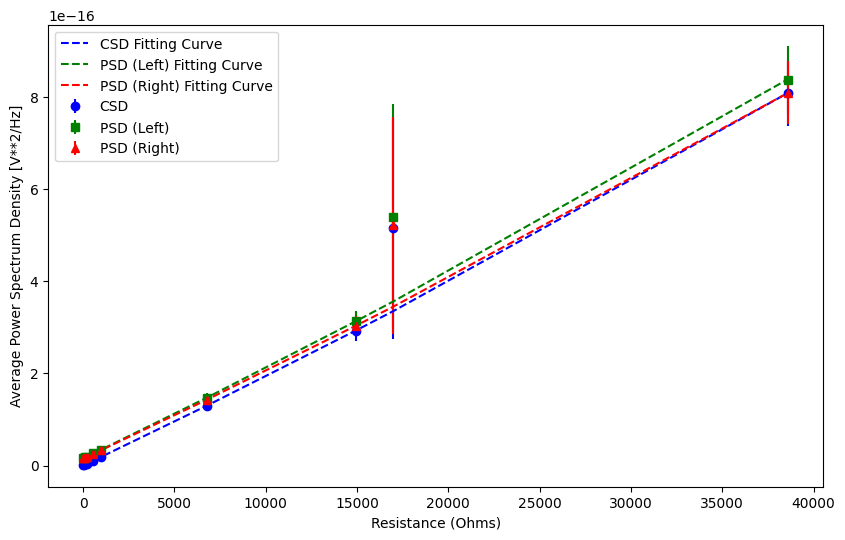

In [8]:

# Obtain the sorted indices
sorted_indices = np.argsort(temperature_kevin)

# Sort the data based on resistance
sorted_resistances = np.array(resistances)[sorted_indices]
sorted_average_csds = np.array(average_csds)[sorted_indices]
sorted_average_psd_lefts = np.array(average_psd_lefts)[sorted_indices]
sorted_average_psd_rights = np.array(average_psd_rights)[sorted_indices]
std_dev_csds = np.array(std_dev_csds)[sorted_indices]
std_dev_psd_lefts = np.array(std_dev_psd_lefts)[sorted_indices]
std_dev_psd_rights = np.array(std_dev_psd_rights)[sorted_indices]

# Constants
temperature_Celsius = 23.3
temperature_kelvin = temperature_Celsius + 273.15  # Convert to Kelvin

# Function to fit
def fitting_function(R, Si, kb, Sv):
    return Si * R**2 + 4 * kb * temperature_kelvin * R + Sv

# Perform fitting for CSD
params_csd, covariance_csd = curve_fit(fitting_function, sorted_resistances, sorted_average_csds,sigma=std_dev_csds)

# Perform fitting for PSD (Left)
params_psd_left, covariance_psd_left = curve_fit(fitting_function, sorted_resistances, sorted_average_psd_lefts,sigma=std_dev_psd_lefts)

# Perform fitting for PSD (Right)
params_psd_right, covariance_psd_right = curve_fit(fitting_function, sorted_resistances, sorted_average_psd_rights,sigma=std_dev_psd_rights)

# ... (previous code)

# Extracting the fitted parameters and uncertainties
Si_csd, kb_csd, Sv_csd = params_csd
Si_psd_left, kb_psd_left, Sv_psd_left = params_psd_left
Si_psd_right, kb_psd_right, Sv_psd_right = params_psd_right

# Extracting uncertainties from covariance matrices
uncertainty_Si_csd, uncertainty_kb_csd, uncertainty_Sv_csd = np.sqrt(np.diag(covariance_csd))
uncertainty_Si_psd_left, uncertainty_kb_psd_left, uncertainty_Sv_psd_left = np.sqrt(np.diag(covariance_psd_left))
uncertainty_Si_psd_right, uncertainty_kb_psd_right, uncertainty_Sv_psd_right = np.sqrt(np.diag(covariance_psd_right))

# Print the fitted parameters and uncertainties
print("CSD Fitting Parameters:")
print("Si:", Si_csd, "±", uncertainty_Si_csd)
print("kb:", kb_csd, "±", uncertainty_kb_csd)
print("Sv:", Sv_csd, "±", uncertainty_Sv_csd)
print("\nPSD (Left) Fitting Parameters:")
print("Si:", Si_psd_left, "±", uncertainty_Si_psd_left)
print("kb:", kb_psd_left, "±", uncertainty_kb_psd_left)
print("Sv:", Sv_psd_left, "±", uncertainty_Sv_psd_left)
print("\nPSD (Right) Fitting Parameters:")
print("Si:", Si_psd_right, "±", uncertainty_Si_psd_right)
print("kb:", kb_psd_right, "±", uncertainty_kb_psd_right)
print("Sv:", Sv_psd_right, "±", uncertainty_Sv_psd_right)

# ... (rest of the code)

# Plot CSD vs Resistance with error bars
plt.figure(figsize=(10, 6))
plt.errorbar(sorted_resistances, np.real(sorted_average_csds), yerr=std_dev_csds, fmt='o', color='blue', label='CSD')
plt.errorbar(sorted_resistances, np.real(sorted_average_psd_lefts), yerr=std_dev_psd_lefts, fmt='s', color='green', label='PSD (Left)')
plt.errorbar(sorted_resistances, np.real(sorted_average_psd_rights), yerr=std_dev_psd_rights, fmt='^', color='red', label='PSD (Right)')

# Plot the fitting curves
fitting_curve_csd = fitting_function(sorted_resistances, Si_csd, kb_csd, Sv_csd)
fitting_curve_psd_left = fitting_function(sorted_resistances, Si_psd_left, kb_psd_left, Sv_psd_left)
fitting_curve_psd_right = fitting_function(sorted_resistances, Si_psd_right, kb_psd_right, Sv_psd_right)

plt.plot(sorted_resistances, fitting_curve_csd, linestyle='--', color='blue', label='CSD Fitting Curve')
plt.plot(sorted_resistances, fitting_curve_psd_left, linestyle='--', color='green', label='PSD (Left) Fitting Curve')
plt.plot(sorted_resistances, fitting_curve_psd_right, linestyle='--', color='red', label='PSD (Right) Fitting Curve')

plt.xlabel('Resistance (Ohms)')
plt.ylabel('Average Power Spectrum Density [V**2/Hz]')
plt.legend()
plt.grid(False)

# Save the figure as a PDF
output_filename = 'averagepsdvsresistance_with_errorbars.pdf'
plt.savefig(output_filename, format='pdf')

plt.show()


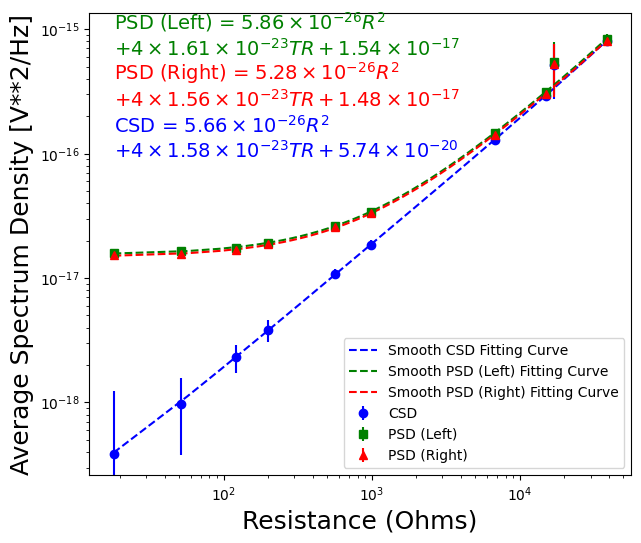

In [9]:
# Generate more points for smooth curve fit
smooth_resistances = np.linspace(sorted_resistances.min(), sorted_resistances.max(), 1000)

# Calculate the smooth fitted curves
smooth_curve_csd = fitting_function(smooth_resistances, Si_csd, kb_csd, Sv_csd)
smooth_curve_psd_left = fitting_function(smooth_resistances, Si_psd_left, kb_psd_left, Sv_psd_left)
smooth_curve_psd_right = fitting_function(smooth_resistances, Si_psd_right, kb_psd_right, Sv_psd_right)

# Plot CSD vs Resistance with error bars
plt.figure(figsize=(7, 6))
plt.errorbar(sorted_resistances, np.real(sorted_average_csds), yerr=std_dev_csds, fmt='o', color='blue', label='CSD')
plt.errorbar(sorted_resistances, np.real(sorted_average_psd_lefts), yerr=std_dev_psd_lefts, fmt='s', color='green', label='PSD (Left)')
plt.errorbar(sorted_resistances, np.real(sorted_average_psd_rights), yerr=std_dev_psd_rights, fmt='^', color='red', label='PSD (Right)')

plt.yscale('log')
plt.xscale('log')
# Plot the smooth fitted curves
plt.plot(smooth_resistances, smooth_curve_csd, linestyle='--', color='blue', label='Smooth CSD Fitting Curve')
plt.plot(smooth_resistances, smooth_curve_psd_left, linestyle='--', color='green', label='Smooth PSD (Left) Fitting Curve')
plt.plot(smooth_resistances, smooth_curve_psd_right, linestyle='--', color='red', label='Smooth PSD (Right) Fitting Curve')

# Function to format the exponent
def format_exponent(value, precision=0):
    value_str = '{:.2e}'.format(value)
    mantissa, exponent = value_str.split('e')
    return '{} \\times 10^{{-{:d}}}'.format(mantissa, abs(int(exponent)))

# Add text annotations for fitting equations
# Add text annotations for fitting equations with line breaks
# Add text annotations for fitting equations with line breaks
plt.text(smooth_resistances[0], smooth_curve_csd[125], rf'CSD = ${format_exponent(Si_csd, 4)} R^2$' + '\n' + rf'$+ 4 \times {format_exponent(kb_csd, 4)} TR + {format_exponent(Sv_csd, 4)}$', fontsize=14, color='blue')
plt.text(smooth_resistances[0], smooth_curve_psd_left[750], rf'PSD (Left) = ${format_exponent(Si_psd_left, 4)} R^2$' + '\n' + rf'$+ 4 \times {format_exponent(kb_psd_left, 4)} TR + {format_exponent(Sv_psd_left, 4)}$', fontsize=14, color='green')
plt.text(smooth_resistances[0], smooth_curve_psd_right[300], rf'PSD (Right) = ${format_exponent(Si_psd_right, 4)} R^2$' + '\n' + rf'$+ 4 \times {format_exponent(kb_psd_right, 4)} TR + {format_exponent(Sv_psd_right, 4)}$', fontsize=14, color='red')



plt.xlabel('Resistance (Ohms)',fontsize=18)
plt.ylabel('Average Spectrum Density [V**2/Hz]',fontsize=18)
plt.legend()
plt.legend(loc="lower right")
plt.grid(False)

# Save the figure as a PDF
output_filename_smooth = 'equation1.pdf'
plt.savefig(output_filename_smooth, format='pdf')

plt.show()


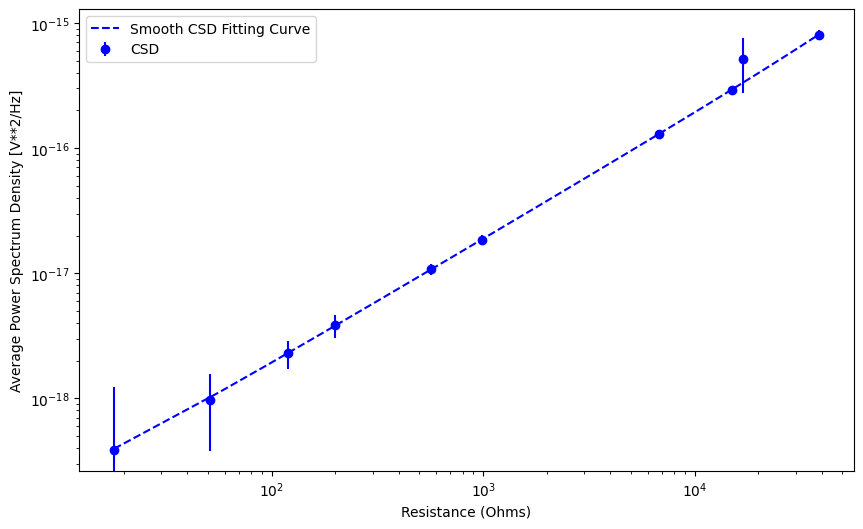

In [10]:
# Generate more points for smooth curve fit
smooth_resistances = np.linspace(sorted_resistances.min(), sorted_resistances.max(), 1000)

# Calculate the smooth fitted curves
smooth_curve_csd = fitting_function(smooth_resistances, Si_csd, kb_csd, Sv_csd)

# Plot CSD vs Resistance with error bars
plt.figure(figsize=(10, 6))
plt.errorbar(sorted_resistances, np.real(sorted_average_csds), yerr=std_dev_csds, fmt='o', color='blue', label='CSD')


# Plot the smooth fitted curves
plt.plot(smooth_resistances, smooth_curve_csd, linestyle='--', color='blue', label='Smooth CSD Fitting Curve')

plt.yscale('log')
plt.xscale('log')
plt.xlabel('Resistance (Ohms)')
plt.ylabel('Average Power Spectrum Density [V**2/Hz]')
plt.legend()
plt.grid(False)

# Save the figure as a PDF
output_filename_smooth = 'averagepsdvsresistance_smooth_fit.pdf'
plt.savefig(output_filename_smooth, format='pdf')

plt.show()


C:\Users\samson\AppData\Local\Temp\ipykernel_18564\1535047480.py:33: WavFileWarning: Chunk (non-data) not understood, skipping it.
  samplerate, rawData = wavfile.read(file_path)
C:\Users\samson\AppData\Local\Temp\ipykernel_18564\2434765197.py:25: RuntimeWarning: divide by zero encountered in divide
  ratio = Rtrans / (1 / (1j * omega * Ctrans) + Rtrans)
C:\Users\samson\AppData\Local\Temp\ipykernel_18564\2434765197.py:25: RuntimeWarning: invalid value encountered in divide
  ratio = Rtrans / (1 / (1j * omega * Ctrans) + Rtrans)
C:\Users\samson\AppData\Local\Temp\ipykernel_18564\1535047480.py:50: RuntimeWarning: invalid value encountered in divide
  temperature_normalPxx_den_csd =(Pxx_den_csd) / (amplifier_gain) ** 2
c:\Users\samson\anaconda3\envs\p309\Lib\site-packages\matplotlib\cbook.py:1699: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
c:\Users\samson\anaconda3\envs\p309\Lib\site-packages\matplotlib\cbook.py:1345: ComplexWarn

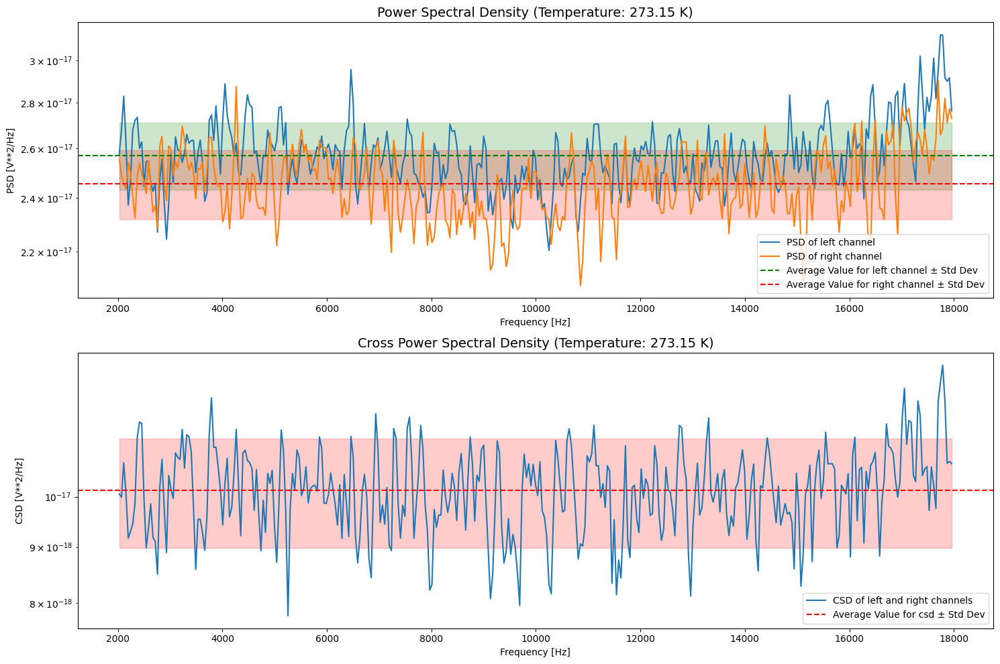

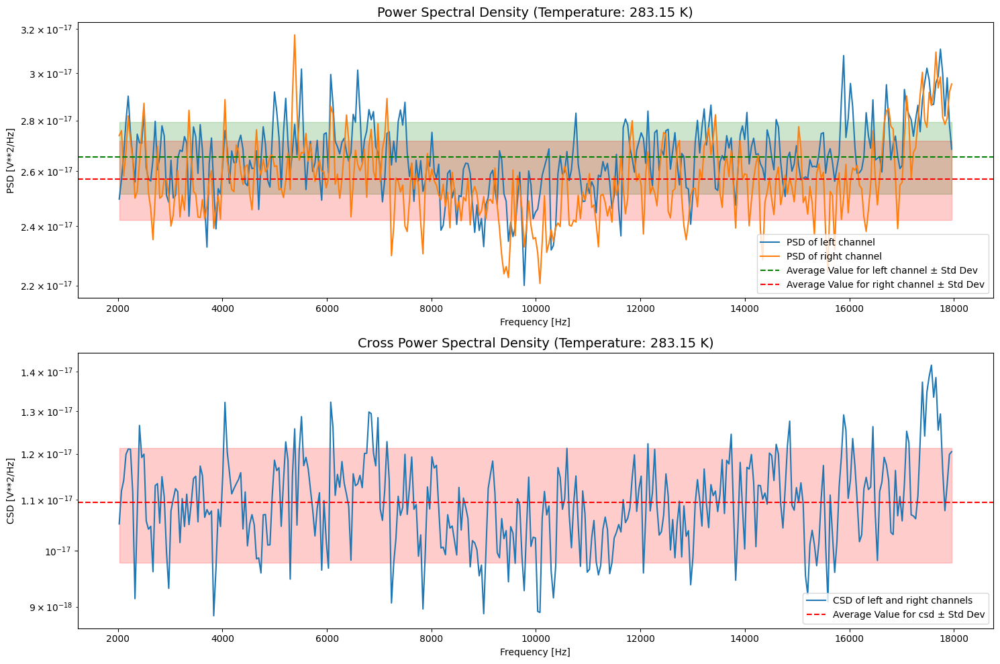

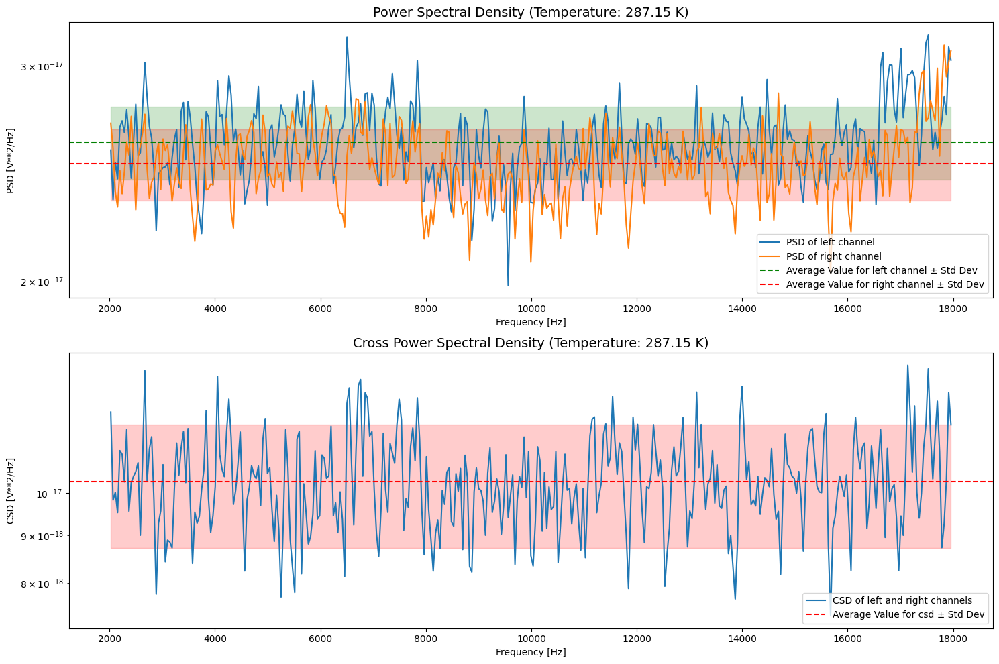

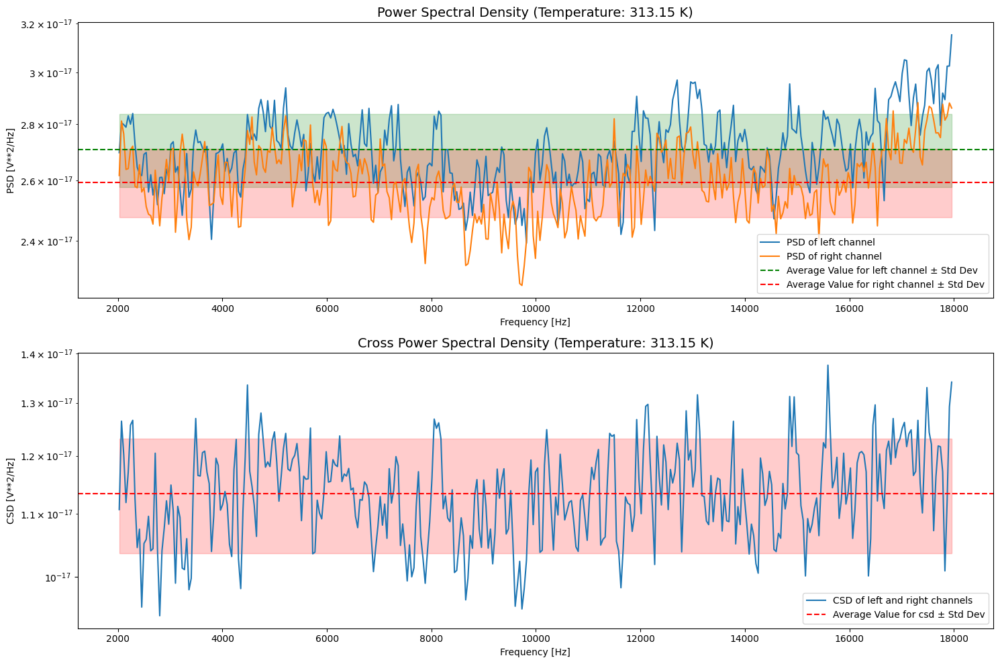

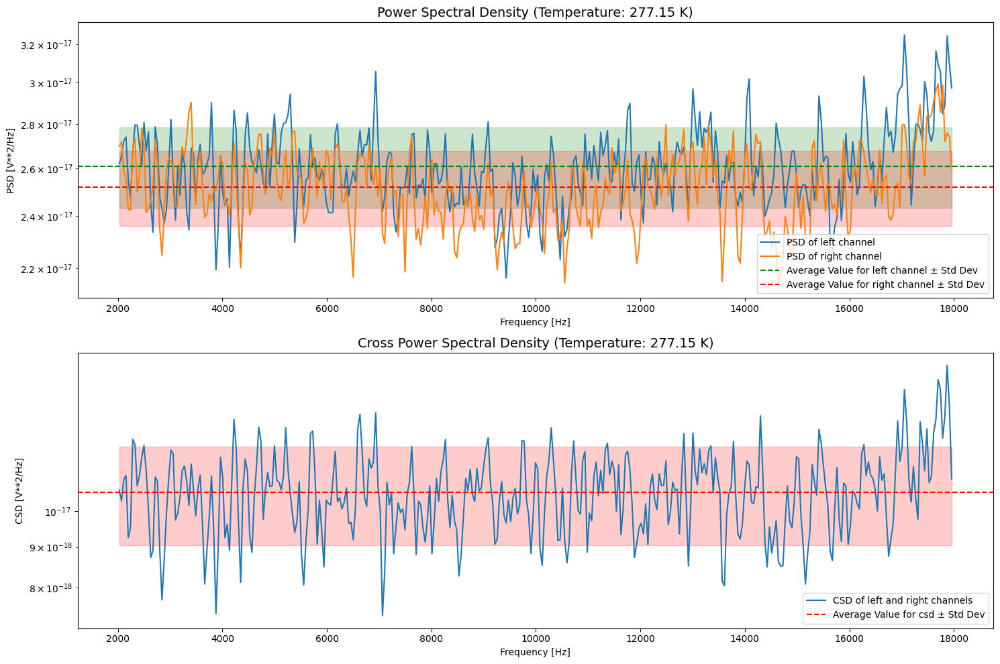

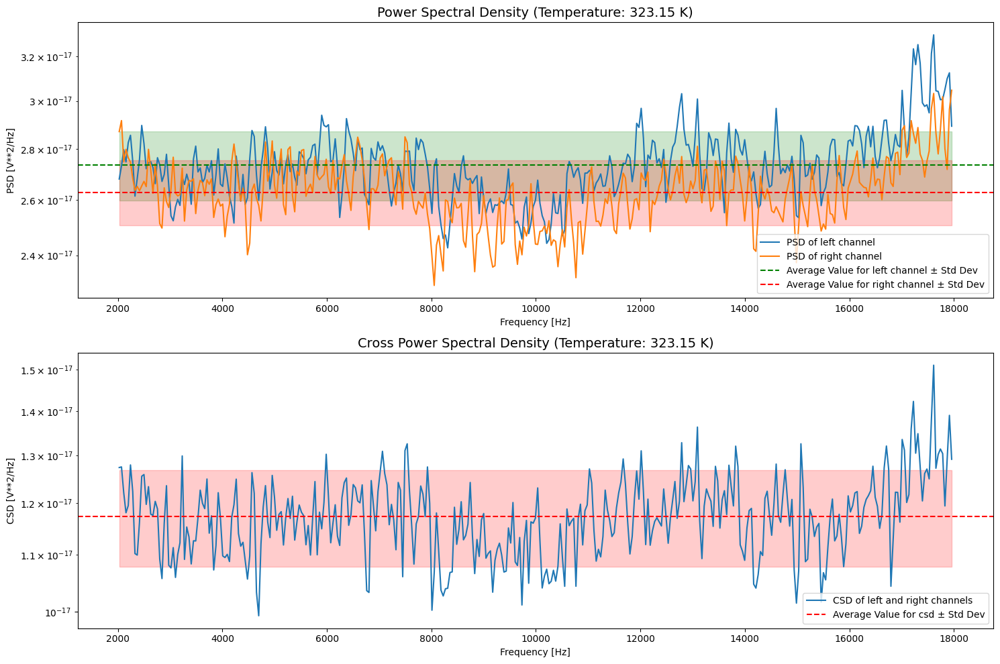

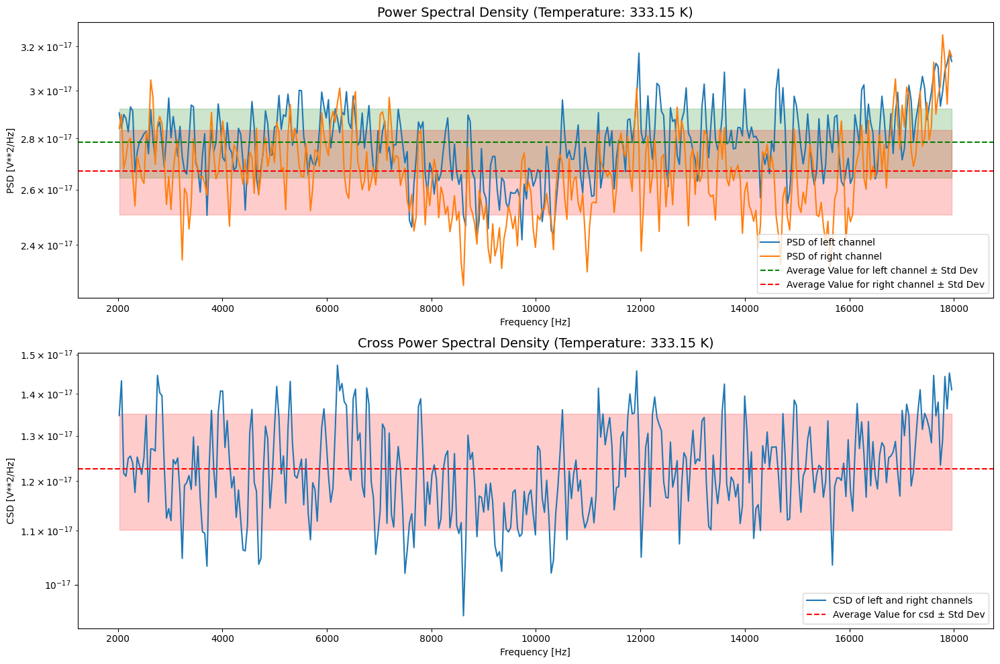

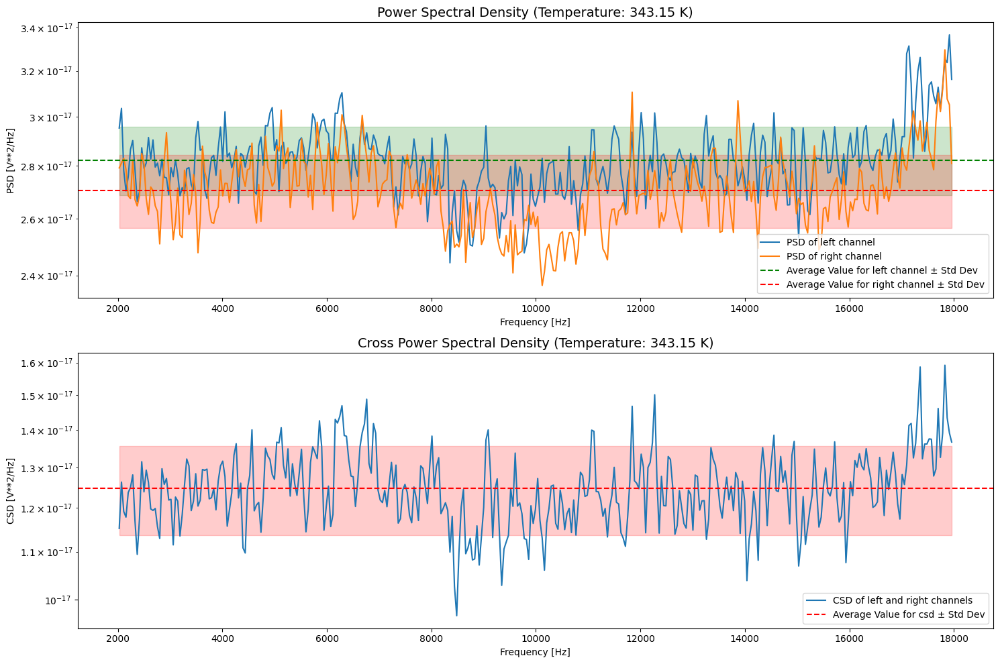

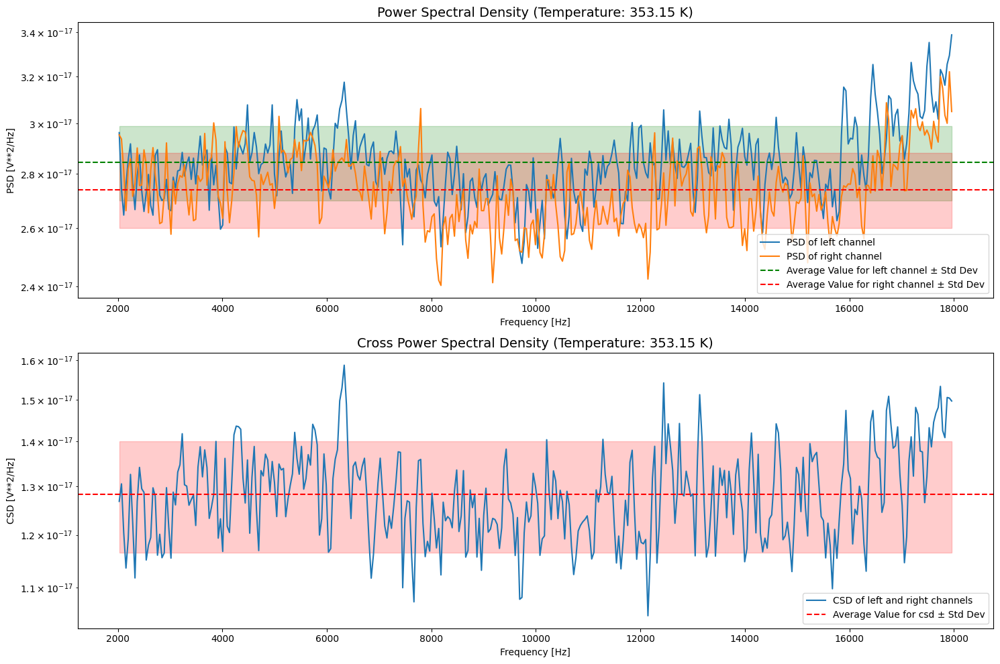

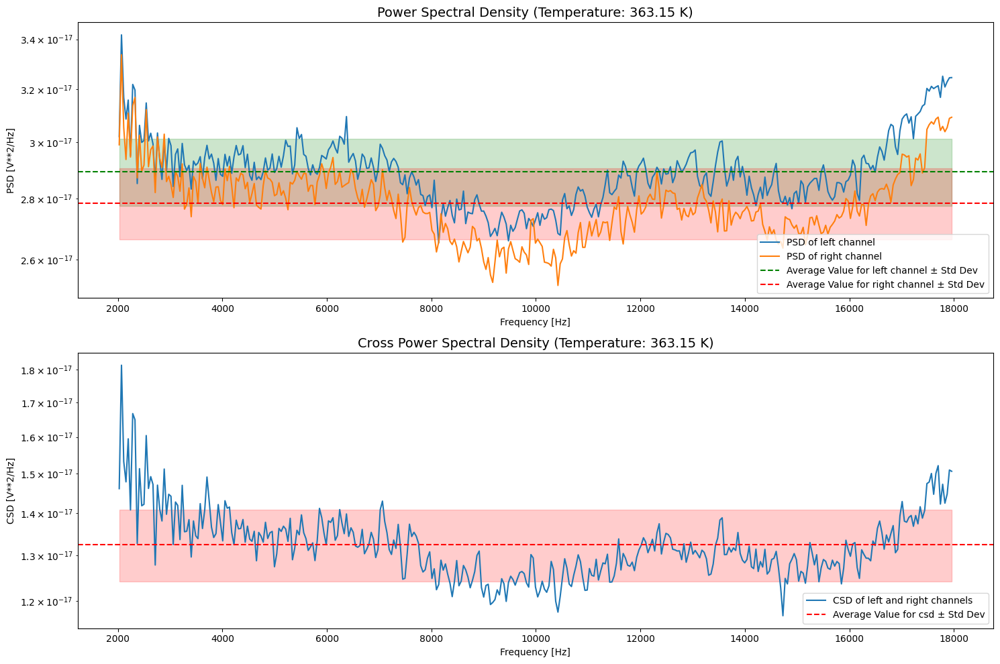

In [11]:

temperature_kelvin = []
temperature_average_csds = []
temperature_average_psd_lefts = []
temperature_average_psd_rights = []
temperature_std_dev_csds = []
temperature_std_dev_psd_lefts = []
temperature_std_dev_psd_rights = []

# Function to extract temperature from file name and convert to Kelvin
def extract_temperature(file_name):
    match = re.match(r'(\d+)c526ohm', file_name)
    if match:
        temperature_Celsius = int(match.group(1))
        temperature_Kelvin = temperature_Celsius + 273.15  # Convert Celsius to Kelvin
        return temperature_Kelvin
    else:
        return None

# Your existing process_audio_file_resistance function with corrected temperature extraction
def process_audio_file_temperature(file_path, coefficient):
    file_name = os.path.basename(file_path)
    temperature_Kelvin = extract_temperature(file_name)

    if temperature_Kelvin is not None and temperature_Kelvin <= 50000:
        temperature_kelvin.append(temperature_Kelvin)
        samplerate, rawData = wavfile.read(file_path)

        data = {'left': coefficient * rawData[:, 0], 'right': coefficient * rawData[:, 1]}

        # Calculate the voltage 'v' from the right channel data
        v_left = data['left'] / 1000
        v_right = data['right'] / 1000
        # Calculate the periodogram CSD
        fs = 44100  # Sampling rate
        f, Pxx_den_per_left = signal.welch(v_left, fs, nperseg=1024)
        f, Pxx_den_per_right = signal.welch(v_right, fs, nperseg=1024)
        f, Pxx_den_csd = signal.csd(v_left, v_right, fs, nperseg=1024)

        # Calculate amplifier gain using fit_function
        amplifier_gain = fit_function(f, a_fit, b_fit, c_fit, d_fit, e_fit)

        # Normalize the power spectral density
        temperature_normalPxx_den_csd =(Pxx_den_csd) / (amplifier_gain) ** 2
        temperature_normalPxx_den_per_left = Pxx_den_per_left / (amplifier_gain) ** 2
        temperature_normalPxx_den_per_right = Pxx_den_per_right / (amplifier_gain) ** 2

        # Filter values in the specified frequency range
        mask = (f >= 2000) & (f <= 18000)
        filtered_frequencies = f[mask]
        filtered_normalPxx_den_csd = temperature_normalPxx_den_csd[mask]
        filtered_normalPxx_den_per_left = temperature_normalPxx_den_per_left[mask]
        filtered_normalPxx_den_right = temperature_normalPxx_den_per_right[mask]
        # Calculate the average value and standard deviation
        temperature_average_value_csd = np.mean(filtered_normalPxx_den_csd)
        temperature_average_value_psd_left = np.mean(filtered_normalPxx_den_per_left)
        temperature_average_value_psd_right = np.mean(filtered_normalPxx_den_right)

        temperature_std_dev_csd = np.std(filtered_normalPxx_den_csd)
        temperature_std_dev_psd_left = np.std(filtered_normalPxx_den_per_left)
        temperature_std_dev_psd_right = np.std(filtered_normalPxx_den_right)

        temperature_average_csds.append(temperature_average_value_csd)
        temperature_average_psd_lefts.append(temperature_average_value_psd_left)
        temperature_average_psd_rights.append(temperature_average_value_psd_right)

        temperature_std_dev_csds.append(temperature_std_dev_csd)
        temperature_std_dev_psd_lefts.append(temperature_std_dev_psd_left)
        temperature_std_dev_psd_rights.append(temperature_std_dev_psd_right)

        # Plot the Welch PSD and the horizontal line at the average value with standard deviation
        # Plotting
        fig, (ax1, ax2) = plt.subplots(2, figsize=(15, 10))

        ax1.set_xlabel('Frequency [Hz]', fontsize=10)
        ax1.set_ylabel('PSD [V**2/Hz]', fontsize=10)
        ax1.set_title(f'Power Spectral Density (Temperature: {temperature_Kelvin} K)', fontsize=14)
        ax2.set_xlabel('Frequency [Hz]', fontsize=10)
        ax2.set_ylabel('CSD [V**2/Hz]', fontsize=10)
        ax2.set_title(f'Cross Power Spectral Density (Temperature: {temperature_Kelvin} K)', fontsize=14)

        ax1.semilogy(filtered_frequencies, temperature_normalPxx_den_per_left[mask], label='PSD of left channel')
        ax1.semilogy(filtered_frequencies, temperature_normalPxx_den_per_right[mask], label='PSD of right channel')
        ax1.axhline(y=temperature_average_value_psd_left, color='g', linestyle='--', label='Average Value for left channel ± Std Dev')
        ax1.fill_between(filtered_frequencies, temperature_average_value_psd_left - temperature_std_dev_psd_left,
                         temperature_average_value_psd_left + temperature_std_dev_psd_left, color='g', alpha=0.2)
        ax1.axhline(y=temperature_average_value_psd_right, color='r', linestyle='--', label='Average Value for right channel ± Std Dev')
        ax1.fill_between(filtered_frequencies, temperature_average_value_psd_right - temperature_std_dev_psd_right,
                         temperature_average_value_psd_right + temperature_std_dev_psd_right, color='r', alpha=0.2)
        ax1.legend(loc="lower right")

        ax2.semilogy(filtered_frequencies, temperature_normalPxx_den_csd[mask], label='CSD of left and right channels')
        ax2.axhline(y=temperature_average_value_csd, color='r', linestyle='--', label='Average Value for csd ± Std Dev')
        ax2.fill_between(filtered_frequencies, temperature_average_value_csd - temperature_std_dev_csd, temperature_average_value_csd + temperature_std_dev_csd,
                         color='r', alpha=0.2)
        ax2.legend(loc="lower right")

        fig.tight_layout()
        plt.show()

# Directory containing audio files for amplifier calibration
folder_path_temp = 'continuoustemperature'

# List all files in the directory for amplifier calibration
file_names_temp = os.listdir(folder_path_temp)

# Filter out non-wav files if needed for amplifier calibration
wav_files_temp = [file for file in file_names_temp if file.lower().endswith('.wav')]

# Full paths to each audio file for amplifier calibration
file_paths_temp = [os.path.join(folder_path_temp, file_name) for file_name in wav_files_temp]

# Assuming 'coefficient' is calculated previously
for file_path_temp in file_paths_temp:
    process_audio_file_temperature(file_path_temp, coefficient)


CSD Fitting Parameters:
kb: 1.5517500899229623e-23 ± 9.941096411323317e-25
Sv: 1.3003380261679053e-18 ± 6.766435127921153e-19

PSD (Left) Fitting Parameters:
kb: 1.589008262982268e-23 ± 8.844818407204012e-25
Sv: 1.6700195885918685e-17 ± 5.968768229852055e-19

PSD (Right) Fitting Parameters:
kb: 1.5409367763182417e-23 ± 1.2568190803487409e-24
Sv: 1.5938494810676165e-17 ± 8.453201316376571e-19


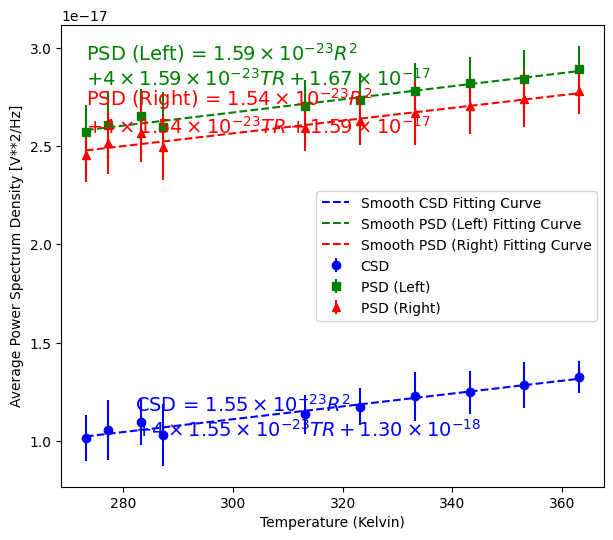

In [112]:
# Function to fit
R = 526
def fitting_function(temperature_kelvin, kb, Sv):
    return 4 * kb * temperature_kelvin * R + Sv

# Modified function to fit both Sv and kb
def fitting_function_both_params(temperature_kelvin, kb, Sv):
    return 4 * kb * temperature_kelvin * R + Sv

# Assuming 'temperature_kelvin' and other relevant variables are available

# Add x uncertainty for temperature (±1 K)
temperature_uncertainty = 1.0
# Reshape temperature_uncertainty to match the number of elements in temperature_kelvin
temperature_with_uncertainty = np.column_stack([temperature_kelvin, np.full_like(temperature_kelvin, temperature_uncertainty)])

sorted_indices = np.argsort(temperature_kelvin)

# Sort the data based on temperature
sorted_temperatures = np.array(temperature_with_uncertainty[:, 0])[sorted_indices]
sorted_temperature_uncertainties = np.array(temperature_with_uncertainty[:, 1])[sorted_indices]
sorted_temperature_average_csds = np.array(temperature_average_csds)[sorted_indices]
std_dev_csds = np.array(temperature_std_dev_csds)[sorted_indices]
sorted_temperature_average_psd_lefts = np.array(temperature_average_psd_lefts)[sorted_indices]
std_dev_psd_lefts = np.array(temperature_std_dev_psd_lefts)[sorted_indices]
sorted_temperature_average_psd_rights = np.array(temperature_average_psd_rights)[sorted_indices]
std_dev_psd_rights = np.array(temperature_std_dev_psd_rights)[sorted_indices]

# Perform fitting for CSD with x uncertainty and both Sv and kb as parameters
params_csd, covariance_csd = curve_fit(fitting_function_both_params, sorted_temperatures, sorted_temperature_average_csds, sigma=std_dev_csds, p0=(1.380649e-23, 1))

# Extracting the fitted parameters for CSD
kb_csd, Sv_csd = params_csd

# Extract uncertainties from covariance matrix for CSD
uncertainty_kb_csd, uncertainty_Sv_csd = np.sqrt(np.diag(covariance_csd))

# Print the fitted parameters and uncertainties for CSD
print("CSD Fitting Parameters:")
print("kb:", kb_csd, "±", uncertainty_kb_csd)
print("Sv:", Sv_csd, "±", uncertainty_Sv_csd)

# Generate more points for smooth curve fit
smooth_temperatures = np.linspace(sorted_temperatures.min(), sorted_temperatures.max(), 1000)

# Calculate the smooth fitted curves for CSD
smooth_curve_csd = fitting_function_both_params(smooth_temperatures, kb_csd, Sv_csd)

# Plot CSD vs Temperature with error bars and smooth curve
plt.figure(figsize=(7, 6))
plt.errorbar(sorted_temperatures, np.real(sorted_temperature_average_csds), yerr=std_dev_csds, fmt='o', color='blue', label='CSD')

# Plot the smooth fitted curve for CSD
plt.plot(smooth_temperatures, smooth_curve_csd, linestyle='--', color='blue', label='Smooth CSD Fitting Curve')

# Perform fitting for PSD (Left) with x uncertainty and both Sv and kb as parameters
params_psd_left, covariance_psd_left = curve_fit(fitting_function_both_params, sorted_temperatures, sorted_temperature_average_psd_lefts, sigma=std_dev_psd_lefts, p0=(1.380649e-23, 1))

# Extracting the fitted parameters for PSD (Left)
kb_psd_left, Sv_psd_left = params_psd_left

# Extract uncertainties from covariance matrix for PSD (Left)
uncertainty_kb_psd_left, uncertainty_Sv_psd_left = np.sqrt(np.diag(covariance_psd_left))

# Print the fitted parameters and uncertainties for PSD (Left)
print("\nPSD (Left) Fitting Parameters:")
print("kb:", kb_psd_left, "±", uncertainty_kb_psd_left)
print("Sv:", Sv_psd_left, "±", uncertainty_Sv_psd_left)

# Calculate the smooth fitted curves for PSD (Left)
smooth_curve_psd_left = fitting_function_both_params(smooth_temperatures, kb_psd_left, Sv_psd_left)

# Plot PSD (Left) vs Temperature with error bars and smooth curve
plt.errorbar(sorted_temperatures, np.real(sorted_temperature_average_psd_lefts), yerr=std_dev_psd_lefts, fmt='s', color='green', label='PSD (Left)')

# Plot the smooth fitted curve for PSD (Left)
plt.plot(smooth_temperatures, smooth_curve_psd_left, linestyle='--', color='green', label='Smooth PSD (Left) Fitting Curve')

# Perform fitting for PSD (Right) with x uncertainty and both Sv and kb as parameters
params_psd_right, covariance_psd_right = curve_fit(fitting_function_both_params, sorted_temperatures, sorted_temperature_average_psd_rights, sigma=std_dev_psd_rights, p0=(1.380649e-23, 1))

# Extracting the fitted parameters for PSD (Right)
kb_psd_right, Sv_psd_right = params_psd_right

# Extract uncertainties from covariance matrix for PSD (Right)
uncertainty_kb_psd_right, uncertainty_Sv_psd_right = np.sqrt(np.diag(covariance_psd_right))

# Print the fitted parameters and uncertainties for PSD (Right)
print("\nPSD (Right) Fitting Parameters:")
print("kb:", kb_psd_right, "±", uncertainty_kb_psd_right)
print("Sv:", Sv_psd_right, "±", uncertainty_Sv_psd_right)

# Calculate the smooth fitted curves for PSD (Right)
smooth_curve_psd_right = fitting_function_both_params(smooth_temperatures, kb_psd_right, Sv_psd_right)

# Plot PSD (Right) vs Temperature with error bars and smooth curve
plt.errorbar(sorted_temperatures, np.real(sorted_temperature_average_psd_rights), yerr=std_dev_psd_rights, fmt='^', color='red', label='PSD (Right)')
plt.plot(smooth_temperatures, smooth_curve_psd_right, linestyle='--', color='red', label='Smooth PSD (Right) Fitting Curve')

# plt.text(smooth_resistances[0], smooth_curve_csd[125], rf'CSD = ${format_exponent(Si_csd, 4)} R^2$' + '\n' + rf'$+ 4 \times {format_exponent(kb_csd, 4)} TR + {format_exponent(Sv_csd, 4)}$', fontsize=14, color='blue')
#plt.text(smooth_resistances[0], smooth_curve_psd_left[750], rf'PSD (Left) = ${format_exponent(Si_psd_left, 4)} R^2$' + '\n' + rf'$+ 4 \times {format_exponent(kb_psd_left, 4)} TR + {format_exponent(Sv_psd_left, 4)}$', fontsize=14, color='green')
#plt.text(smooth_resistances[0], smooth_curve_psd_right[300], rf'PSD (Right) = ${format_exponent(Si_psd_right, 4)} R^2$' + '\n' + rf'$+ 4 \times {format_exponent(kb_psd_right, 4)} TR + {format_exponent(Sv_psd_right, 4)}$', fontsize=14, color='red')




plt.xlabel('Temperature (Kelvin)')
plt.ylabel('Average Power Spectrum Density [V**2/Hz]')
plt.legend()
plt.grid(False)

# Save the figure as a PDF
output_filename = 'temperature_with_errorbars_smooth_fit_csd_psd_left_right.pdf'
plt.savefig(output_filename, format='pdf')

plt.show()


In [ ]:
print(sorted_temperature_average_csds)
print(sorted_temperatures)

[2.30265449e-18-5.53773793e-20j 3.83926016e-18-1.04212641e-19j
 2.92279966e-16-5.10095691e-18j 5.14531277e-16-8.19933996e-18j
 3.84782055e-19+7.25566299e-21j 8.07050651e-16-1.27707618e-17j
 9.71911681e-19-8.32371803e-21j 1.08027936e-17-2.00699528e-19j
 1.29116792e-16-2.44117589e-18j 1.85110484e-17-2.42506445e-19j]
[273.15 277.15 283.15 287.15 313.15 323.15 333.15 343.15 353.15 363.15]


c:\Users\samson\anaconda3\envs\p309\Lib\site-packages\numpy\lib\function_base.py:628: ComplexWarning: Casting complex values to real discards the imaginary part
  a = asarray(a, dtype=dtype, order=order)


CSD Fitting Parameters:
kb: 8.112120844815997e-22
Sv: -2.293098394437138e-16

PSD (Left) Fitting Parameters:
kb: 2.065929549199245e-21
Sv: -9.907616435543265e-16

PSD (Right) Fitting Parameters:
kb: 1.0447553698621935e-21
Sv: -3.643627942975456e-16


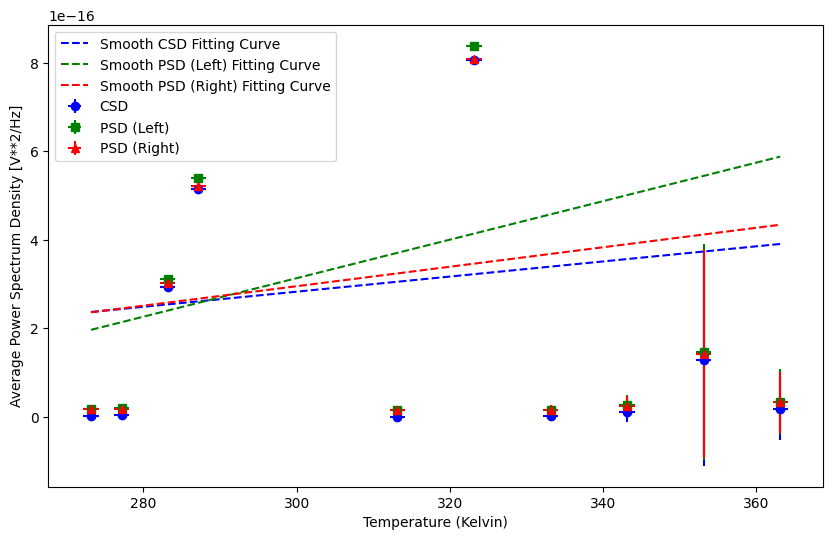

In [20]:

# Function to fit
R = 526
def fitting_function(temperature_kelvin, kb, Sv):
    return 4 * kb * temperature_kelvin * R + Sv

# Assuming 'temperature_kelvin' and other relevant variables are available

# Add x uncertainty for temperature (±1 K)
temperature_uncertainty = 1.0
temperature_with_uncertainty = np.column_stack([temperature_kelvin, np.full_like(temperature_kelvin, temperature_uncertainty)])

sorted_indices = np.argsort(temperature_kelvin)

# Sort the data based on temperature
sorted_temperatures = np.array(temperature_with_uncertainty[:, 0])[sorted_indices]
sorted_temperature_uncertainties = np.array(temperature_with_uncertainty[:, 1])[sorted_indices]
sorted_temperature_average_csds = np.array(average_csds)[sorted_indices]
sorted_temperature_average_psd_lefts = np.array(average_psd_lefts)[sorted_indices]
sorted_temperature_average_psd_rights = np.array(average_psd_rights)[sorted_indices]
std_dev_csds = np.array(std_dev_csds)[sorted_indices]
std_dev_psd_lefts = np.array(std_dev_psd_lefts)[sorted_indices]
std_dev_psd_rights = np.array(std_dev_psd_rights)[sorted_indices]

# Perform fitting for CSD with y and x uncertainty
params_csd, covariance_csd = curve_fit(fitting_function, sorted_temperatures, sorted_temperature_average_csds, sigma=std_dev_csds, absolute_sigma=True)

# Extracting the fitted parameters
kb_csd, Sv_csd = params_csd

# Print the fitted parameters
print("CSD Fitting Parameters:")
print("kb:", kb_csd)
print("Sv:", Sv_csd)

# Perform fitting for PSD (Left) with y and x uncertainty
params_psd_left, covariance_psd_left = curve_fit(fitting_function, sorted_temperatures, sorted_temperature_average_psd_lefts, sigma=std_dev_psd_lefts, absolute_sigma=True)

# Extracting the fitted parameters for PSD (Left)
kb_psd_left, Sv_psd_left = params_psd_left

# Print the fitted parameters for PSD (Left)
print("\nPSD (Left) Fitting Parameters:")
print("kb:", kb_psd_left)
print("Sv:", Sv_psd_left)

# Perform fitting for PSD (Right) with y and x uncertainty
params_psd_right, covariance_psd_right = curve_fit(fitting_function, sorted_temperatures, sorted_temperature_average_psd_rights, sigma=std_dev_psd_rights, absolute_sigma=True)

# Extracting the fitted parameters for PSD (Right)
kb_psd_right, Sv_psd_right = params_psd_right

# Print the fitted parameters for PSD (Right)
print("\nPSD (Right) Fitting Parameters:")
print("kb:", kb_psd_right)
print("Sv:", Sv_psd_right)

# Generate more points for smooth curve fit
smooth_temperatures = np.linspace(sorted_temperatures.min(), sorted_temperatures.max(), 1000)

# Calculate the smooth fitted curves
smooth_curve_csd = fitting_function(smooth_temperatures, kb_csd, Sv_csd)
smooth_curve_psd_left = fitting_function(smooth_temperatures, kb_psd_left, Sv_psd_left)
smooth_curve_psd_right = fitting_function(smooth_temperatures, kb_psd_right, Sv_psd_right)

# Plot CSD, PSD (Left), and PSD (Right) vs Temperature with error bars
plt.figure(figsize=(10, 6))
plt.errorbar(sorted_temperatures, np.real(sorted_temperature_average_csds), yerr=std_dev_csds, xerr=sorted_temperature_uncertainties, fmt='o', color='blue', label='CSD')
plt.errorbar(sorted_temperatures, np.real(sorted_temperature_average_psd_lefts), yerr=std_dev_psd_lefts, xerr=sorted_temperature_uncertainties, fmt='s', color='green', label='PSD (Left)')
plt.errorbar(sorted_temperatures, np.real(sorted_temperature_average_psd_rights), yerr=std_dev_psd_rights, xerr=sorted_temperature_uncertainties, fmt='^', color='red', label='PSD (Right)')

# Plot the smooth fitted curves
plt.plot(smooth_temperatures, smooth_curve_csd, linestyle='--', color='blue', label='Smooth CSD Fitting Curve')
plt.plot(smooth_temperatures, smooth_curve_psd_left, linestyle='--', color='green', label='Smooth PSD (Left) Fitting Curve')
plt.plot(smooth_temperatures, smooth_curve_psd_right, linestyle='--', color='red', label='Smooth PSD (Right) Fitting Curve')

plt.xlabel('Temperature (Kelvin)')
plt.ylabel('Average Power Spectrum Density [V**2/Hz]')
plt.legend()
plt.grid(False)

# Save the figure as a PDF
output_filename = 'temperature_with_errorbars_all_PSD.pdf'
plt.savefig(output_filename, format='pdf')

plt.show()


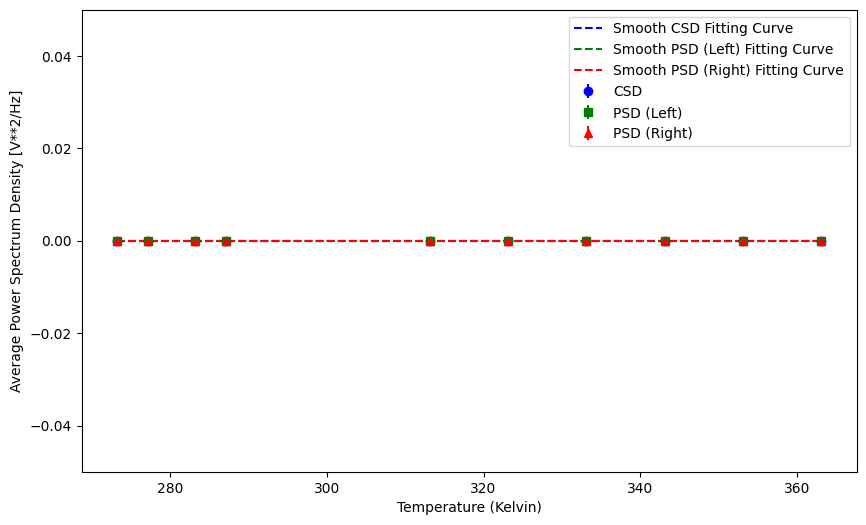

In [ ]:
# Plot CSD vs Temperature with error bars
plt.figure(figsize=(10, 6))
plt.errorbar(sorted_temperatures, np.real(sorted_temperature_average_csds), yerr=std_dev_csds, fmt='o', color='blue', label='CSD')
plt.errorbar(sorted_temperatures, np.real(sorted_temperature_average_psd_lefts), yerr=std_dev_psd_lefts, fmt='s', color='green', label='PSD (Left)')
plt.errorbar(sorted_temperatures, np.real(sorted_temperature_average_psd_rights), yerr=std_dev_psd_rights, fmt='^', color='red', label='PSD (Right)')

# Plot the smooth fitted curves
plt.plot(smooth_temperatures, smooth_curve_csd, linestyle='--', color='blue', label='Smooth CSD Fitting Curve')
plt.plot(smooth_temperatures, smooth_curve_psd_left, linestyle='--', color='green', label='Smooth PSD (Left) Fitting Curve')
plt.plot(smooth_temperatures, smooth_curve_psd_right, linestyle='--', color='red', label='Smooth PSD (Right) Fitting Curve')

plt.xlabel('Temperature (Kelvin)')
plt.ylabel('Average Power Spectrum Density [V**2/Hz]')
plt.legend()
plt.grid(False)

# Set y-limits to zoom in
plt.ylim(-0.05, 0.05)  # Adjust the values as needed

# Save the figure as a PDF
output_filename = 'temperature_with_errorbars_smooth_fit_zoomed.pdf'
plt.savefig(output_filename, format='pdf')

plt.show()


c:\Users\samson\anaconda3\envs\p309\Lib\site-packages\numpy\lib\function_base.py:628: ComplexWarning: Casting complex values to real discards the imaginary part
  a = asarray(a, dtype=dtype, order=order)


CSD Fitting Parameters:
kb: -8.48249354261335e-24
Sv: 2.0815318133970865e-16
CSD Fitting Parameters:
kb: -8.48249354261335e-24
Sv: 2.0815318133970865e-16


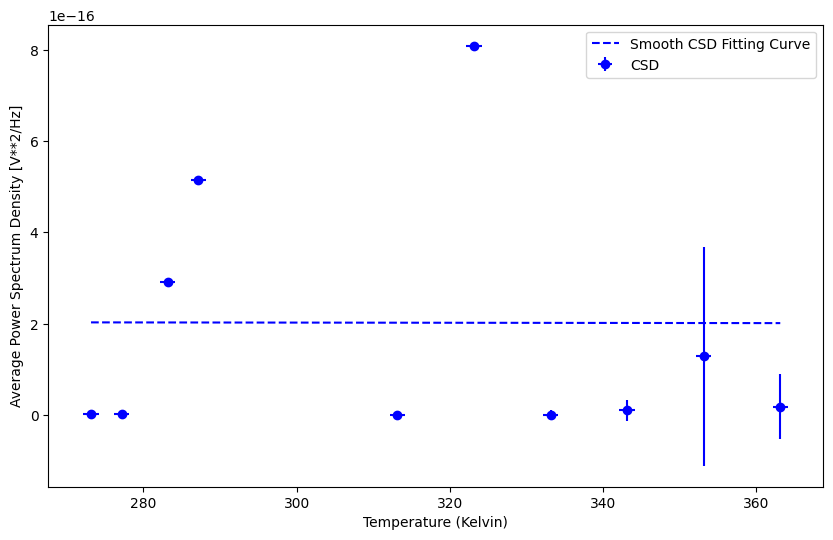

In [21]:


# Function to fit
R = 526
def fitting_function(temperature_kelvin, kb, Sv):
    return  4 * kb * temperature_kelvin * R + Sv

# Assuming 'temperature_kelvin' and other relevant variables are available

# Add x uncertainty for temperature (±1 K)
temperature_uncertainty = 1.0
temperature_with_uncertainty = np.column_stack([temperature_kelvin, np.full_like(temperature_kelvin, temperature_uncertainty)])

sorted_indices = np.argsort(temperature_kelvin)

# Sort the data based on temperature
sorted_temperatures = np.array(temperature_with_uncertainty[:, 0])[sorted_indices]
sorted_temperature_uncertainties = np.array(temperature_with_uncertainty[:, 1])[sorted_indices]
sorted_temperature_average_csds = np.array(average_csds)[sorted_indices]
std_dev_csds = np.array(std_dev_csds)[sorted_indices]

# Perform fitting for CSD with y and x uncertainty
params_csd, covariance_csd = curve_fit(fitting_function, sorted_temperatures, sorted_temperature_average_csds, sigma=std_dev_csds, absolute_sigma=True)

# Extracting the fitted parameters
kb_csd, Sv_csd = params_csd

# Print the fitted parameters
print("CSD Fitting Parameters:")
print("kb:", kb_csd)
print("Sv:", Sv_csd)


# Print the fitted parameters
print("CSD Fitting Parameters:")
print("kb:", kb_csd)
print("Sv:", Sv_csd)

# Generate more points for smooth curve fit
smooth_temperatures = np.linspace(sorted_temperatures.min(), sorted_temperatures.max(), 1000)

# Calculate the smooth fitted curve
smooth_curve_csd = fitting_function(smooth_temperatures, kb_csd, Sv_csd)

# Plot CSD vs Temperature with error bars
plt.figure(figsize=(10, 6))
plt.errorbar(sorted_temperatures, np.real(sorted_temperature_average_csds), yerr=std_dev_csds, xerr=sorted_temperature_uncertainties, fmt='o', color='blue', label='CSD')

# Plot the smooth fitted curve
plt.plot(smooth_temperatures, smooth_curve_csd, linestyle='--', color='blue', label='Smooth CSD Fitting Curve')

plt.xlabel('Temperature (Kelvin)')
plt.ylabel('Average Power Spectrum Density [V**2/Hz]')
plt.legend()
plt.grid(False)

# Save the figure as a PDF
output_filename = 'temperature_with_errorbars.pdf'
plt.savefig(output_filename, format='pdf')

plt.show()


c:\Users\samson\anaconda3\envs\p309\Lib\site-packages\numpy\lib\function_base.py:628: ComplexWarning: Casting complex values to real discards the imaginary part
  a = asarray(a, dtype=dtype, order=order)


CSD Fitting Parameters:
kb: 8.699574329274822e-22
Sv: -4.039419738441016e-16

PSD (Left) Fitting Parameters:
kb: 1.393724246364398e-21
Sv: -6.151174238779566e-16

PSD (Right) Fitting Parameters:
kb: 2.619215019832202e-22
Sv: 4.0615483974314744e-17


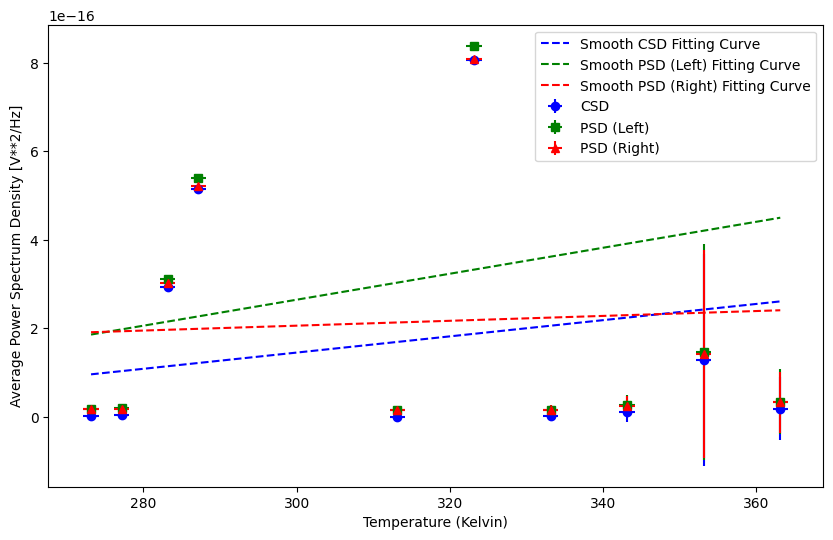

In [22]:


# Function to fit
R = 526
def fitting_function(temperature_kelvin, kb, Sv):
    return 4 * kb * temperature_kelvin * R + Sv

# Assuming 'temperature_kelvin' and other relevant variables are available

# Add x uncertainty for temperature (±1 K)
temperature_uncertainty = 1.0
temperature_with_uncertainty = np.column_stack([temperature_kelvin, np.full_like(temperature_kelvin, temperature_uncertainty)])

sorted_indices = np.argsort(temperature_kelvin)

# Sort the data based on temperature
sorted_temperatures = np.array(temperature_with_uncertainty[:, 0])[sorted_indices]
sorted_temperature_uncertainties = np.array(temperature_with_uncertainty[:, 1])[sorted_indices]
sorted_temperature_average_csds = np.array(average_csds)[sorted_indices]
sorted_temperature_average_psd_lefts = np.array(average_psd_lefts)[sorted_indices]
sorted_temperature_average_psd_rights = np.array(average_psd_rights)[sorted_indices]
std_dev_csds = np.array(std_dev_csds)[sorted_indices]
std_dev_psd_lefts = np.array(std_dev_psd_lefts)[sorted_indices]
std_dev_psd_rights = np.array(std_dev_psd_rights)[sorted_indices]

# Perform fitting for CSD with y and x uncertainty
params_csd, covariance_csd = curve_fit(fitting_function, sorted_temperatures, sorted_temperature_average_csds, sigma=std_dev_csds, absolute_sigma=True)

# Extracting the fitted parameters
kb_csd, Sv_csd = params_csd

# Print the fitted parameters
print("CSD Fitting Parameters:")
print("kb:", kb_csd)
print("Sv:", Sv_csd)

# Perform fitting for PSD (Left) with y and x uncertainty
params_psd_left, covariance_psd_left = curve_fit(fitting_function, sorted_temperatures, sorted_temperature_average_psd_lefts, sigma=std_dev_psd_lefts, absolute_sigma=True)

# Extracting the fitted parameters for PSD (Left)
kb_psd_left, Sv_psd_left = params_psd_left

# Print the fitted parameters for PSD (Left)
print("\nPSD (Left) Fitting Parameters:")
print("kb:", kb_psd_left)
print("Sv:", Sv_psd_left)

# Perform fitting for PSD (Right) with y and x uncertainty
params_psd_right, covariance_psd_right = curve_fit(fitting_function, sorted_temperatures, sorted_temperature_average_psd_rights, sigma=std_dev_psd_rights, absolute_sigma=True)

# Extracting the fitted parameters for PSD (Right)
kb_psd_right, Sv_psd_right = params_psd_right

# Print the fitted parameters for PSD (Right)
print("\nPSD (Right) Fitting Parameters:")
print("kb:", kb_psd_right)
print("Sv:", Sv_psd_right)

# Generate more points for smooth curve fit
smooth_temperatures = np.linspace(sorted_temperatures.min(), sorted_temperatures.max(), 1000)

# Calculate the smooth fitted curves
smooth_curve_csd = fitting_function(smooth_temperatures, kb_csd, Sv_csd)
smooth_curve_psd_left = fitting_function(smooth_temperatures, kb_psd_left, Sv_psd_left)
smooth_curve_psd_right = fitting_function(smooth_temperatures, kb_psd_right, Sv_psd_right)

# Plot CSD, PSD (Left), and PSD (Right) vs Temperature with error bars
plt.figure(figsize=(10, 6))
plt.errorbar(sorted_temperatures, np.real(sorted_temperature_average_csds), yerr=std_dev_csds, xerr=sorted_temperature_uncertainties, fmt='o', color='blue', label='CSD')
plt.errorbar(sorted_temperatures, np.real(sorted_temperature_average_psd_lefts), yerr=std_dev_psd_lefts, xerr=sorted_temperature_uncertainties, fmt='s', color='green', label='PSD (Left)')
plt.errorbar(sorted_temperatures, np.real(sorted_temperature_average_psd_rights), yerr=std_dev_psd_rights, xerr=sorted_temperature_uncertainties, fmt='^', color='red', label='PSD (Right)')

# Plot the smooth fitted curves
plt.plot(smooth_temperatures, smooth_curve_csd, linestyle='--', color='blue', label='Smooth CSD Fitting Curve')
plt.plot(smooth_temperatures, smooth_curve_psd_left, linestyle='--', color='green', label='Smooth PSD (Left) Fitting Curve')
plt.plot(smooth_temperatures, smooth_curve_psd_right, linestyle='--', color='red', label='Smooth PSD (Right) Fitting Curve')

plt.xlabel('Temperature (Kelvin)')
plt.ylabel('Average Power Spectrum Density [V**2/Hz]')
plt.legend()
plt.grid(False)

# Save the figure as a PDF
output_filename = 'temperature_with_errorbars_all_PSD.pdf'
plt.savefig(output_filename, format='pdf')

plt.show()
